# P3 : Préparez des données pour un organisme de santé publique

## Contexte et Mission : 
L'agence Santé publique France souhaite améliorer sa base de données Open Food Facts et fait appel aux services de votre entreprise. Cette base de données open source est mise à la disposition de particuliers et d’organisations afin de leur permettre de connaître la qualité nutritionnelle de produits.
Aujourd’hui, pour ajouter un produit à la base de données d'Open Food Facts, il est nécessaire de remplir de nombreux champs textuels et numériques, ce qui peut conduire à des erreurs de saisie et à des valeurs manquantes dans la base. 
 

L’agence Santé publique France confie à votre entreprise la création d’un système de suggestion ou d’auto-complétion pour aider les usagers à remplir plus efficacement la base de données. Dans un premier temps, vous devez vous concentrer sur la prise en main des données, et d’abord les nettoyer et les explorer.

 

Vous êtes missionné sur le projet de nettoyage et exploration des données en interne, afin de déterminer la faisabilité de cette idée d’application de Santé publique France.

## Etape 1 : Nettoyez et filtrez des features et produits
- collecter et préparer mes données brutes, c'est-à-dire les avoir rassemblées dans un format approprié pour l'analyse. Exemple: utilisation d’une dataframe pandas.
- identifier ma cible selon les critères demandés.
- Mettre en place un processus clair et automatisé pour filtrer les features (variables / colonnes) et des produits (lignes) qui seront utilisés pour atteindre l’objectif de mon projet.

In [1]:
# Importer les librairies nécessaires à l'analyse 
import pandas as pd 
import missingno as msno 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats as st
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
from scipy.stats import f_oneway
from matplotlib.collections import LineCollection
from mpl_toolkits.mplot3d import Axes3D

In [2]:
# Charger mon dataframe 
# Lire le fichier CSV en spécifiant le délimiteur comme une tabulation (\t)
data = pd.read_csv('fr.openfoodfacts.org.products.csv', delimiter='\t', encoding='utf-8')

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_7232\1696911107.py:3: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('fr.openfoodfacts.org.products.csv', delimiter='\t', encoding='utf-8')


In [46]:
# Afficher les 5 premières lignes de mon dataframe
data.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
# Calculer la taille de mon dataframe
data.shape

(320772, 162)

In [48]:
# Informations sur la taille de données, le nombre de chaque type de données et l'utilisation de la mémoire
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [278]:
# Afficher les types des colonnes
data.dtypes

code                        object
url                         object
creator                     object
created_t                   object
created_datetime            object
                            ...   
carbon-footprint_100g      float64
nutrition-score-fr_100g    float64
nutrition-score-uk_100g    float64
glycemic-index_100g        float64
water-hardness_100g        float64
Length: 162, dtype: object

In [279]:
# Vérifier les valeurs manquantes
data.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

In [280]:
# Vérifier les valeurs dupliquées
data.duplicated().sum()

0

In [281]:
# Statistiques descriptives
data.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


<Axes: >

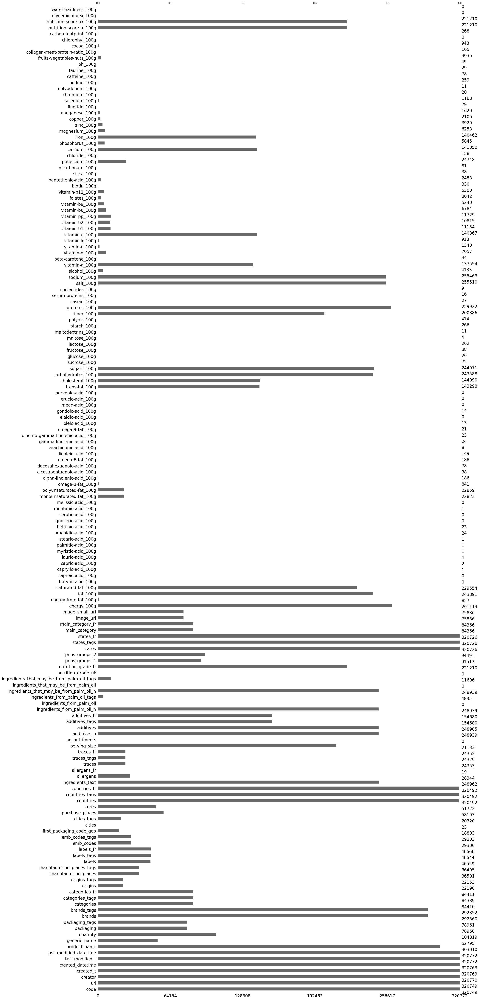

In [283]:
# Visualiser les valeurs manquantes sous forme de graphique à barres
msno.bar(data) 

In [3]:
# Afficher les différentes groupes de catégories de produits
data[['pnns_groups_1','pnns_groups_2', 'main_category', 'main_category_fr', 'categories_fr']].tail(50)


,pnns_groups_1,pnns_groups_2,main_category,main_category_fr,categories_fr
320722,NaN,NaN,NaN,NaN,NaN
320723,NaN,NaN,NaN,NaN,NaN
320724,NaN,NaN,NaN,NaN,NaN
320725,NaN,NaN,NaN,NaN,NaN
320726,Fish Meat Eggs,Fish and seafood,en:salmons,Saumons,"Produits de la mer,Poissons,Saumons"
320727,NaN,NaN,NaN,NaN,NaN
320728,NaN,NaN,NaN,NaN,NaN
320729,NaN,NaN,NaN,NaN,NaN
320730,NaN,NaN,NaN,NaN,NaN
320731,NaN,NaN,NaN,NaN,NaN


In [286]:
# Afficher les catégories 'pnns_groups_1' 
data.pnns_groups_1.unique()

array([nan, 'unknown', 'Fruits and vegetables', 'Sugary snacks',
       'Cereals and potatoes', 'Composite foods', 'Fish Meat Eggs',
       'Beverages', 'Fat and sauces', 'fruits-and-vegetables',
       'Milk and dairy products', 'Salty snacks', 'sugary-snacks',
       'cereals-and-potatoes', 'salty-snacks'], dtype=object)

In [288]:
# Afficher les catégories 'pnns_groups_2'
data.pnns_groups_2.unique()

array([nan, 'unknown', 'Vegetables', 'Biscuits and cakes', 'Bread',
       'Legumes', 'Pizza pies and quiche', 'Meat', 'Sweets',
       'Non-sugared beverages', 'Sweetened beverages',
       'Dressings and sauces', 'One-dish meals', 'vegetables', 'Soups',
       'Chocolate products', 'Alcoholic beverages', 'Fruits', 'Sandwich',
       'Cereals', 'Milk and yogurt', 'Fats', 'Cheese', 'Appetizers',
       'Nuts', 'Breakfast cereals', 'Artificially sweetened beverages',
       'Fruit juices', 'Eggs', 'Fish and seafood', 'Dried fruits',
       'Ice cream', 'Processed meat', 'Potatoes', 'Dairy desserts',
       'Fruit nectars', 'pastries', 'Tripe dishes', 'fruits',
       'Salty and fatty products', 'cereals', 'legumes', 'nuts'],
      dtype=object)

In [58]:
# Afficher les catégories 'main_category'
data.main_category.unique()

array([nan, 'en:fresh-vegetables', 'en:pastries', ...,
       'en:balsamic-vinaigrette',
       'en:cremes-vegetales-a-base-de-coco-pour-cuisiner',
       'en:asian-grocery'], dtype=object)

In [59]:
# Afficher les catégories 'main_category_fr'
data.main_category_fr.unique()

array([nan, 'Légumes frais', 'Pâtisseries', ...,
       'en:Balsamic-vinaigrette',
       'en:Cremes-vegetales-a-base-de-coco-pour-cuisiner',
       'en:Asian-grocery'], dtype=object)

In [61]:
# Afficher les catégories 'categories_fr'
data.categories_fr.unique()

array([nan,
       "Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Aliments à base de plantes frais,Légumes et dérivés,Légumes frais,Légumes-feuilles",
       'Snacks sucrés,Biscuits et gâteaux,Pâtisseries', ...,
       "Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Surgelés,Pains,Pains spéciaux,Viennoiseries surgelées",
       "Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Surgelés,Pains,Pains précuits,Entrées et snacks surgelés",
       "Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Pains,Biscottes,Biscottes-au-sarrasin"],
      dtype=object)

** Conclusion *
*****
On choisi 'pnns_groups_1'  comme 2éme variable catégorielle, car il a peu de catégories ce qui facilite l'analyse des données par la suite.

In [4]:
# Liste des features
features = data.columns.tolist()
features

['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'product_name',
 'generic_name',
 'quantity',
 'packaging',
 'packaging_tags',
 'brands',
 'brands_tags',
 'categories',
 'categories_tags',
 'categories_fr',
 'origins',
 'origins_tags',
 'manufacturing_places',
 'manufacturing_places_tags',
 'labels',
 'labels_tags',
 'labels_fr',
 'emb_codes',
 'emb_codes_tags',
 'first_packaging_code_geo',
 'cities',
 'cities_tags',
 'purchase_places',
 'stores',
 'countries',
 'countries_tags',
 'countries_fr',
 'ingredients_text',
 'allergens',
 'allergens_fr',
 'traces',
 'traces_tags',
 'traces_fr',
 'serving_size',
 'no_nutriments',
 'additives_n',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_n',
 'ingredients_from_palm_oil',
 'ingredients_from_palm_oil_tags',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil',
 'ingredients_that_may_be_from_palm_oil_tags',
 'nutritio

In [5]:
# Choix de la cible (feature catégorielle avec moins de 50% de valeurs manquantes)
cible = 'nutrition_grade_fr'

# Filtrage et nettoyage des données
data.dropna(subset=[cible], inplace=True)  # Supprimer les lignes sans valeur pour la cible
data.reset_index(drop=True, inplace=True)  # Réinitialiser l'index
cible_data = data[cible]  # Séparer la cible du reste du dataset
cible_data

0         d
1         b
2         d
3         c
4         d
         ..
221205    a
221206    a
221207    b
221208    c
221209    b
Name: nutrition_grade_fr, Length: 221210, dtype: object

In [6]:
# Affichage des taux de remplissage des features
taux_remplissage = data.count() / len(data) * 100
taux_remplissage

code                       100.000000
url                        100.000000
creator                    100.000000
created_t                  100.000000
created_datetime            99.999548
                              ...    
carbon-footprint_100g        0.103974
nutrition-score-fr_100g    100.000000
nutrition-score-uk_100g    100.000000
glycemic-index_100g          0.000000
water-hardness_100g          0.000000
Length: 162, dtype: float64

In [7]:
# Sélection des features avec plus de 50% de valeurs présentes
features_interessantes = taux_remplissage[taux_remplissage > 50].index.tolist()
features_interessantes

['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'product_name',
 'brands',
 'brands_tags',
 'countries',
 'countries_tags',
 'countries_fr',
 'ingredients_text',
 'serving_size',
 'additives_n',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'nutrition_grade_fr',
 'states',
 'states_tags',
 'states_fr',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'vitamin-a_100g',
 'vitamin-c_100g',
 'calcium_100g',
 'iron_100g',
 'nutrition-score-fr_100g',
 'nutrition-score-uk_100g']

In [8]:
# Suppression des produits en double
data.drop_duplicates(inplace=True)

In [9]:
data

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,2017-03-09T10:35:11Z,1489055712,2017-03-09T10:35:12Z,Organic Muesli,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055650,2017-03-09T10:34:10Z,1489055651,2017-03-09T10:34:11Z,Zen Party Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,1489092300,2017-03-09T20:45:00Z,1489092300,2017-03-09T20:45:00Z,Natural Cassava,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,-1.0,NaN,NaN
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,1437817626,2015-07-25T09:47:06Z,1442237848,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-4.0,-4.0,NaN,NaN
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,1491079938,2017-04-01T20:52:18Z,1491079939,2017-04-01T20:52:19Z,Amandes,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,1367163039,2013-04-28T15:30:39Z,1371690556,2013-06-20T01:09:16Z,Thé vert Earl grey,thé bio équitable,50 g,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,NaN,NaN


In [11]:
# Automatisation du processus avec une fonction
def nettoyer_donnees(data, features_a_conserver):
    data.dropna(subset=[cible], inplace=True)
    data.reset_index(drop=True, inplace=True)
    cible_data = data[cible]
    taux_remplissage = data.count() / len(data) * 100
    features_interessantes = taux_remplissage[(taux_remplissage > 50) | (taux_remplissage.index.isin(features_a_conserver))].index.tolist()
    data = data[features_interessantes]
    data.drop_duplicates(inplace=True)
    return data, cible_data

# Caractéristiques à conserver même si elles ont moins de 50% de valeurs disponibles ( à utiliser comme variable qualitative )
features_a_conserver = ['pnns_groups_1']

# Appel de la fonction avec les données brutes et la liste des caractéristiques à conserver
data_nettoyee, cible_data_nettoyee = nettoyer_donnees(data, features_a_conserver)

# Afficher mes données nettoyées
data_nettoyee

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_7232\3027039983.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop_duplicates(inplace=True)


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,torn-glasser,...,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,grizzlies,...,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,2017-03-09T10:35:11Z,1489055712,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,daddy-s-muesli,...,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055650,2017-03-09T10:34:10Z,1489055651,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,sunridge,...,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,1489092300,2017-03-09T20:45:00Z,1489092300,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,industria-de-casabe-paul,...,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,1437817626,2015-07-25T09:47:06Z,1442237848,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,le-pain-des-fleurs,...,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,1491079938,2017-04-01T20:52:18Z,1491079939,2017-04-01T20:52:19Z,Amandes,Biosic,biosic,...,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,1367163039,2013-04-28T15:30:39Z,1371690556,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,lobodis,...,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0,0.0


In [13]:
# Supprimer les colonnes redondantes 'additives_n', 'additives', 'additives_tags', et garder la colonne la plus informative 'additives_fr'
data_nettoyee1 = data_nettoyee.drop(['additives_n', 'additives', 'additives_tags' ], axis=1)
data_nettoyee1

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,torn-glasser,...,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,grizzlies,...,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,2017-03-09T10:35:11Z,1489055712,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,daddy-s-muesli,...,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055650,2017-03-09T10:34:10Z,1489055651,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,sunridge,...,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,1489092300,2017-03-09T20:45:00Z,1489092300,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,industria-de-casabe-paul,...,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,1437817626,2015-07-25T09:47:06Z,1442237848,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,le-pain-des-fleurs,...,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,1491079938,2017-04-01T20:52:18Z,1491079939,2017-04-01T20:52:19Z,Amandes,Biosic,biosic,...,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,1367163039,2013-04-28T15:30:39Z,1371690556,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,lobodis,...,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0,0.0


In [14]:
# Supprimer les colonnes Temps sous format _t  (UNIX timestamp format (number of seconds since Jan 1st 1970)) et garder que les temps  _datetime qui sont sous format ISO 8601, yyyy-mm-ddThh:mn:ssZ ex 1977-04-22T06:00:00Z
# Donc à supprimer colonnes 'created_t' et 'last_modified_t'
data_nettoyee2 = data_nettoyee1.drop(['created_t', 'last_modified_t'], axis=1)
data_nettoyee2

,code,url,creator,created_datetime,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,US,en:united-states,...,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,torn-glasser,US,en:united-states,...,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:31Z,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,grizzlies,US,en:united-states,...,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:11Z,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,daddy-s-muesli,US,en:united-states,...,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:34:10Z,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,sunridge,US,en:united-states,...,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,2017-03-09T20:45:00Z,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,industria-de-casabe-paul,US,en:united-states,...,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,2015-07-25T09:47:06Z,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,le-pain-des-fleurs,France,en:france,...,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,2017-04-01T20:52:18Z,2017-04-01T20:52:19Z,Amandes,Biosic,biosic,France,en:france,...,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,2013-04-28T15:30:39Z,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,lobodis,France,en:france,...,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0,0.0


In [15]:
# Supprimer les colonnes _tags car le format classique sans tags et plus représentable 
# Donc on supprime 'brands_tags', 'countries_tags', 'states_tags'
data_nettoyee3 = data_nettoyee2.drop(['brands_tags', 'countries_tags', 'states_tags'], axis=1)
data_nettoyee3 

,code,url,creator,created_datetime,last_modified_datetime,product_name,brands,countries,countries_fr,ingredients_text,...,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,US,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",...,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,US,États-Unis,"Peanuts, wheat flour, sugar, rice flour, tapio...",...,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:31Z,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,US,États-Unis,"Organic hazelnuts, organic cashews, organic wa...",...,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:11Z,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,US,États-Unis,"Org oats, org hemp granola (org oats, evaporat...",...,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:34:10Z,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,US,États-Unis,"Roasted peanuts (peanuts, peanut or canola oil...",...,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,2017-03-09T20:45:00Z,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,US,États-Unis,Cassava.,...,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,2015-07-25T09:47:06Z,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,France,France,NaN,...,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,2017-04-01T20:52:18Z,2017-04-01T20:52:19Z,Amandes,Biosic,France,France,NaN,...,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,2013-04-28T15:30:39Z,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,France,France,"thé vert, arôme naturel bergamote avec autres ...",...,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0,0.0


In [16]:
# Supprrimer la colonne redondante 'nutrition-score-uk_100g' et garder 'nutrition-score-fr_100g'
data_nettoyee4 = data_nettoyee3.drop(['nutrition-score-uk_100g'], axis=1)
data_nettoyee4

,code,url,creator,created_datetime,last_modified_datetime,product_name,brands,countries,countries_fr,ingredients_text,...,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,US,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",...,14.29,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,US,États-Unis,"Peanuts, wheat flour, sugar, rice flour, tapio...",...,17.86,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:31Z,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,US,États-Unis,"Organic hazelnuts, organic cashews, organic wa...",...,3.57,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:11Z,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,US,États-Unis,"Org oats, org hemp granola (org oats, evaporat...",...,15.62,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:34:10Z,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,US,États-Unis,"Roasted peanuts (peanuts, peanut or canola oil...",...,3.33,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,2017-03-09T20:45:00Z,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,US,États-Unis,Cassava.,...,2.35,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,2015-07-25T09:47:06Z,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,France,France,NaN,...,2.60,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,2017-04-01T20:52:18Z,2017-04-01T20:52:19Z,Amandes,Biosic,France,France,NaN,...,3.89,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,2013-04-28T15:30:39Z,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,France,France,"thé vert, arôme naturel bergamote avec autres ...",...,0.50,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0


In [17]:
# Supprrimer les colonnes redondantes 'countries', 'states' et garder 'countries_fr' et  'states_fr'
data_nettoyee5 = data_nettoyee4.drop(['countries', 'states'], axis=1)
data_nettoyee5

,code,url,creator,created_datetime,last_modified_datetime,product_name,brands,countries_fr,ingredients_text,serving_size,...,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",28 g (1 ONZ),...,14.29,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0
1,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T14:32:37Z,2017-03-09T14:32:37Z,Peanuts,Torn & Glasser,États-Unis,"Peanuts, wheat flour, sugar, rice flour, tapio...",28 g (0.25 cup),...,17.86,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0
2,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:31Z,2017-03-09T10:35:31Z,Organic Salted Nut Mix,Grizzlies,États-Unis,"Organic hazelnuts, organic cashews, organic wa...",28 g (0.25 cup),...,3.57,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0
3,16124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:35:11Z,2017-03-09T10:35:12Z,Organic Muesli,Daddy's Muesli,États-Unis,"Org oats, org hemp granola (org oats, evaporat...",64 g (0.5 cup),...,15.62,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0
4,16872,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,2017-03-09T10:34:10Z,2017-03-09T10:34:11Z,Zen Party Mix,Sunridge,États-Unis,"Roasted peanuts (peanuts, peanut or canola oil...",30 g (0.25 cup),...,3.33,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,2017-03-09T20:45:00Z,2017-03-09T20:45:00Z,Natural Cassava,Industria De Casabe Paul,États-Unis,Cassava.,85 g (85 GRM),...,2.35,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0
221206,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,2015-07-25T09:47:06Z,2015-09-14T13:37:28Z,Tartines craquantes bio au sarrasin,Le Pain des fleurs,France,NaN,NaN,...,2.60,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0
221207,9900000000233,http://world-fr.openfoodfacts.org/produit/9900...,kiliweb,2017-04-01T20:52:18Z,2017-04-01T20:52:19Z,Amandes,Biosic,France,NaN,NaN,...,3.89,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0
221208,99111250,http://world-fr.openfoodfacts.org/produit/9911...,balooval,2013-04-28T15:30:39Z,2013-06-20T01:09:16Z,Thé vert Earl grey,Lobodis,France,"thé vert, arôme naturel bergamote avec autres ...",NaN,...,0.50,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0


In [18]:
# Supprimer les colonnes inutiles pour l'analyse 'code', 'url', 'creator','created_datetime', 'last_modified_datetime','brands', 'origins'
df = data_nettoyee5.drop(['code', 'url', 'creator', 'created_datetime', 'last_modified_datetime','brands', 'countries_fr', 'ingredients_text', 'serving_size', 'additives_fr', 'states_fr'], axis=1)
df

,product_name,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,...,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,Banana Chips Sweetened (Whole),0.0,0.0,d,NaN,2243.0,28.57,28.57,0.0,0.018,...,14.29,3.6,3.57,0.00000,0.000000,0.0,0.0214,0.000,0.00129,14.0
1,Peanuts,0.0,0.0,b,NaN,1941.0,17.86,0.00,0.0,0.000,...,17.86,7.1,17.86,0.63500,0.250000,0.0,0.0000,0.071,0.00129,0.0
2,Organic Salted Nut Mix,0.0,0.0,d,NaN,2540.0,57.14,5.36,NaN,NaN,...,3.57,7.1,17.86,1.22428,0.482000,NaN,NaN,0.143,0.00514,12.0
3,Organic Muesli,0.0,0.0,c,NaN,1833.0,18.75,4.69,NaN,NaN,...,15.62,9.4,14.06,0.13970,0.055000,NaN,NaN,0.062,0.00422,7.0
4,Zen Party Mix,0.0,0.0,d,NaN,2230.0,36.67,5.00,NaN,NaN,...,3.33,6.7,16.67,1.60782,0.633000,NaN,NaN,0.133,0.00360,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,Natural Cassava,0.0,0.0,a,NaN,1477.0,0.00,0.00,0.0,0.000,...,2.35,4.7,1.18,0.03048,0.012000,0.0,0.0000,0.000,0.00127,-1.0
221206,Tartines craquantes bio au sarrasin,NaN,NaN,a,Cereals and potatoes,1643.0,2.80,0.60,NaN,NaN,...,2.60,5.9,13.00,0.68000,0.267717,NaN,NaN,NaN,0.00380,-4.0
221207,Amandes,NaN,NaN,b,NaN,2406.0,NaN,3.73,NaN,NaN,...,3.89,12.2,21.22,0.10000,0.039370,NaN,NaN,NaN,NaN,0.0
221208,Thé vert Earl grey,0.0,0.0,c,Beverages,21.0,0.20,0.20,NaN,NaN,...,0.50,0.2,0.50,0.02540,0.010000,NaN,NaN,NaN,NaN,2.0


In [20]:
# statistiques descriptives
df.describe()

,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,196179.000000,196179.000000,2.210190e+05,203733.000000,221019.000000,135460.000000,137205.000000,203707.000000,221019.000000,193770.000000,221019.000000,221019.000000,221019.000000,132107.000000,132981.000000,135380.000000,134643.000000,221210.000000
mean,0.021873,0.057315,1.196345e+03,13.367035,4.970118,0.071263,0.019234,33.228723,15.023803,2.828862,7.775905,1.640345,0.645805,0.000144,0.008287,0.112150,0.003102,9.165535
std,0.148001,0.275256,6.989607e+03,16.208529,7.659902,1.559047,0.366526,28.319596,21.181012,13.016507,8.123994,137.416005,54.100789,0.002322,0.437166,2.751945,0.172223,9.055903
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,-3.570000,0.000000,0.000000,-17.860000,0.000000,-3.570000,0.000000,0.000000,0.000000,-0.002100,0.000000,-0.000260,-15.000000
25%,0.000000,0.000000,4.520000e+02,0.880000,0.000000,0.000000,0.000000,7.000000,1.300000,0.000000,1.900000,0.100000,0.039370,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,1.195000e+03,7.140000,1.790000,0.000000,0.000000,24.000000,5.000000,1.500000,5.700000,0.650000,0.255906,0.000000,0.000000,0.036000,0.001010,10.000000
75%,0.000000,0.000000,1.716000e+03,21.430000,7.140000,0.000000,0.020000,59.000000,23.080000,3.600000,10.710000,1.361440,0.536000,0.000102,0.002800,0.107000,0.002400,16.000000
max,2.000000,6.000000,3.251373e+06,714.290000,550.000000,369.000000,95.238000,209.380000,3520.000000,5380.000000,430.000000,64312.800000,25320.000000,0.800000,152.941200,694.737000,50.000000,40.000000


In [19]:
# features qui restent après suppression
df.columns.tolist()

['product_name',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'nutrition_grade_fr',
 'pnns_groups_1',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'vitamin-a_100g',
 'vitamin-c_100g',
 'calcium_100g',
 'iron_100g',
 'nutrition-score-fr_100g']

In [20]:
# Sélection des colonnes numériques
colonnes_numeriques = df.select_dtypes(include=['float64', 'int64']).columns

# Créer un DataFrame contenant uniquement les colonnes numériques
data_numerique = df[colonnes_numeriques]

# Calculer la matrice de corrélation
matrice_correlation = data_numerique.corr()
matrice_correlation

,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
ingredients_from_palm_oil_n,1.000000,0.187947,0.010755,0.066643,0.096293,0.001595,-0.000497,0.084682,0.070572,0.001513,-0.021785,-0.000677,-0.000677,0.002900,0.001888,0.002620,0.000974,0.117685
ingredients_that_may_be_from_palm_oil_n,0.187947,1.000000,0.002123,0.020667,0.038062,0.008642,0.002963,0.022241,0.015359,-0.012897,-0.050958,-0.000832,-0.000832,0.002231,0.000763,0.000258,0.006541,0.058014
energy_100g,0.010755,0.002123,1.000000,0.082382,0.070601,0.019421,0.004738,0.057389,0.057192,0.077569,0.041498,-0.000140,-0.000140,-0.010642,-0.008867,0.008966,0.007460,0.067765
fat_100g,0.066643,0.020667,0.082382,1.000000,0.709222,0.023019,0.022787,-0.062439,-0.013000,0.142918,0.254675,-0.002482,-0.002482,-0.002443,-0.009324,0.012083,-0.001494,0.567727
saturated-fat_100g,0.096293,0.038062,0.070601,0.709222,1.000000,0.012280,0.042158,-0.027735,0.157294,0.156084,0.190453,-0.002191,-0.002191,0.001117,-0.009526,0.022749,-0.004066,0.624222
trans-fat_100g,0.001595,0.008642,0.019421,0.023019,0.012280,1.000000,-0.000324,0.006939,0.003821,-0.002747,-0.010105,-0.000126,-0.000126,-0.002932,-0.001760,-0.000783,-0.000284,0.022101
cholesterol_100g,-0.000497,0.002963,0.004738,0.022787,0.042158,-0.000324,1.000000,-0.034079,-0.016676,-0.023832,0.044917,0.138004,0.138004,0.003010,-0.000699,0.004859,-0.000142,0.030884
carbohydrates_100g,0.084682,0.022241,0.057389,-0.062439,-0.027735,0.006939,-0.034079,1.000000,0.640863,0.264203,-0.130024,0.001520,0.001520,-0.014619,-0.001178,-0.012327,0.013684,0.263539
sugars_100g,0.070572,0.015359,0.057192,-0.013000,0.157294,0.003821,-0.016676,0.640863,1.000000,0.350221,-0.207575,0.001107,0.001107,-0.014504,-0.000325,-0.007456,0.007934,0.441537
fiber_100g,0.001513,-0.012897,0.077569,0.142918,0.156084,-0.002747,-0.023832,0.264203,0.350221,1.000000,0.191998,-0.001758,-0.001758,0.056468,0.003291,-0.000108,0.010579,-0.046989


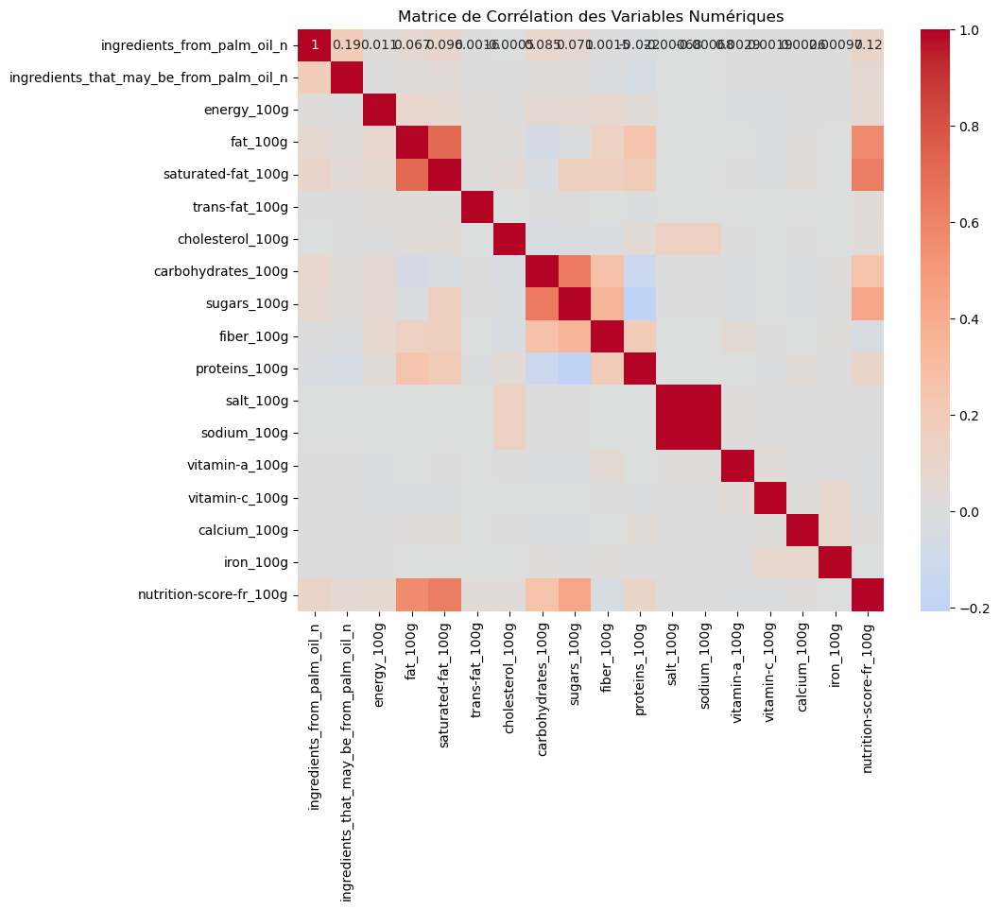

In [21]:
# Création de la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(matrice_correlation, annot=True, cmap='coolwarm', center=0)

# Ajout d'un titre
plt.title('Matrice de Corrélation des Variables Numériques')

# Affichage de la heatmap
plt.show()

In [23]:
# Supprimer une des 2 colonnes bien corrélés
# Supprimer 'sodium_100g' et garder 'salt_100g' (vu que le sodium est une des composantes du Sel NaCl)
# Supprimer 'sugars_100g' et garder 'carbohydrates_100g' car les sucres sont un des composants des glucides ou carbohydates.
# Supprimer 'fat_100g' et garder 'saturated-fat_100g', car c'est important de voir si présence de graisse saturée dans les composantes (mauvaises pour la santé)
df1 = df.drop(['sodium_100g', 'sugars_100g', 'fat_100g'], axis=1)
df1

,product_name,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,Banana Chips Sweetened (Whole),0.0,0.0,d,NaN,2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129,14.0
1,Peanuts,0.0,0.0,b,NaN,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129,0.0
2,Organic Salted Nut Mix,0.0,0.0,d,NaN,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,12.0
3,Organic Muesli,0.0,0.0,c,NaN,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422,7.0
4,Zen Party Mix,0.0,0.0,d,NaN,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,Natural Cassava,0.0,0.0,a,NaN,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127,-1.0
221206,Tartines craquantes bio au sarrasin,NaN,NaN,a,Cereals and potatoes,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,-4.0
221207,Amandes,NaN,NaN,b,NaN,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN,0.0
221208,Thé vert Earl grey,0.0,0.0,c,Beverages,21.0,0.20,NaN,NaN,0.50,0.2,0.50,0.02540,NaN,NaN,NaN,NaN,2.0


In [25]:
# Supprimes les 2 colonnes mal renseignés 'ingredients_from_palm_oil_n'  avec que des 0 et NaN et 'ingredients_that_may_be_from_palm_oil_n'
df2 = df1.drop(['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n'], axis=1)
df2

,product_name,nutrition_grade_fr,pnns_groups_1,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,Banana Chips Sweetened (Whole),d,NaN,2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129,14.0
1,Peanuts,b,NaN,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129,0.0
2,Organic Salted Nut Mix,d,NaN,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,12.0
3,Organic Muesli,c,NaN,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422,7.0
4,Zen Party Mix,d,NaN,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,Natural Cassava,a,NaN,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127,-1.0
221206,Tartines craquantes bio au sarrasin,a,Cereals and potatoes,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,-4.0
221207,Amandes,b,NaN,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN,0.0
221208,Thé vert Earl grey,c,Beverages,21.0,0.20,NaN,NaN,0.50,0.2,0.50,0.02540,NaN,NaN,NaN,NaN,2.0


In [26]:
# Supprimer la colonne 'nutrition-score-fr_100g', car on a déjà la cible 'nutrition_grade_fr' qui correspond aux valeurs de 'nutrition-score-fr_100g'
df3 = df2.drop('nutrition-score-fr_100g', axis=1)
df3

,product_name,nutrition_grade_fr,pnns_groups_1,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
0,Banana Chips Sweetened (Whole),d,NaN,2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129
1,Peanuts,b,NaN,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129
2,Organic Salted Nut Mix,d,NaN,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514
3,Organic Muesli,c,NaN,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422
4,Zen Party Mix,d,NaN,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,Natural Cassava,a,NaN,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127
221206,Tartines craquantes bio au sarrasin,a,Cereals and potatoes,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380
221207,Amandes,b,NaN,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN
221208,Thé vert Earl grey,c,Beverages,21.0,0.20,NaN,NaN,0.50,0.2,0.50,0.02540,NaN,NaN,NaN,NaN


In [28]:
# Supprimer les lignes dont les valeurs des variables _100g sont supérieures à 100, à l'exception du variable energy_100g (en kj)	

# Identifier les colonnes se terminant par _100g, à l'exception de energy_100g
cols_to_check = [col for col in df3.columns if col.endswith('_100g') and col != 'energy_100g']

# Filtrer les lignes où les valeurs des colonnes identifiées sont supérieures à 100
df3_filtered = df3[~(df3[cols_to_check] > 100).any(axis=1)]

# Afficher le DataFrame filtré
df3_filtered
df0 = df3_filtered
df0

,product_name,nutrition_grade_fr,pnns_groups_1,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
0,Banana Chips Sweetened (Whole),d,NaN,2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129
1,Peanuts,b,NaN,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129
2,Organic Salted Nut Mix,d,NaN,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514
3,Organic Muesli,c,NaN,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422
4,Zen Party Mix,d,NaN,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,Natural Cassava,a,NaN,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127
221206,Tartines craquantes bio au sarrasin,a,Cereals and potatoes,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380
221207,Amandes,b,NaN,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN
221208,Thé vert Earl grey,c,Beverages,21.0,0.20,NaN,NaN,0.50,0.2,0.50,0.02540,NaN,NaN,NaN,NaN


In [29]:
# statistiques descriptives
df0.describe()

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
count,2.209420e+05,220942.000000,135408.000000,137150.000000,203631.000000,193703.000000,220942.000000,220942.000000,132059.000000,132934.000000,135331.000000,134592.000000
mean,1.195308e+03,4.967342,0.064553,0.018780,33.225462,2.800482,7.774905,1.236312,0.000143,0.007121,0.097864,0.003045
std,6.973558e+03,7.559553,0.930716,0.325467,28.309921,4.477891,8.073671,3.942207,0.002318,0.123307,0.460020,0.171569
min,0.000000e+00,0.000000,-3.570000,0.000000,0.000000,0.000000,-3.570000,0.000000,0.000000,-0.002100,0.000000,-0.000260
25%,4.520000e+02,0.000000,0.000000,0.000000,7.000000,0.000000,1.900000,0.100000,0.000000,0.000000,0.000000,0.000000
50%,1.195000e+03,1.790000,0.000000,0.000000,24.000000,1.500000,5.700000,0.647700,0.000000,0.000000,0.036000,0.001010
75%,1.716000e+03,7.140000,0.000000,0.020000,59.000000,3.600000,10.710000,1.361440,0.000102,0.002800,0.107000,0.002400
max,3.251373e+06,100.000000,100.000000,95.238000,100.000000,100.000000,100.000000,100.000000,0.800000,35.714300,82.000000,50.000000


In [30]:
# Remplacer les valeurs négatives par 0

# Séparer les colonnes numériques et non numériques
df_numeric = df0.select_dtypes(include=['number'])
df_non_numeric = df0.select_dtypes(exclude=['number'])

# Remplacer les valeurs négatives par 0 dans les colonnes numériques tout en gardant les NaN
df_numeric = df_numeric.applymap(lambda x: x if pd.isna(x) or x >= 0 else 0)

# Combiner de nouveau les colonnes
df0_F = pd.concat([df_numeric, df_non_numeric], axis=1)

# Afficher le DataFrame pour vérifier
df0_F

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_7232\776083903.py:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_numeric = df_numeric.applymap(lambda x: x if pd.isna(x) or x >= 0 else 0)


,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,product_name,nutrition_grade_fr,pnns_groups_1
0,2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129,Banana Chips Sweetened (Whole),d,NaN
1,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129,Peanuts,b,NaN
2,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,Organic Salted Nut Mix,d,NaN
3,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422,Organic Muesli,c,NaN
4,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,Zen Party Mix,d,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221205,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127,Natural Cassava,a,NaN
221206,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,Tartines craquantes bio au sarrasin,a,Cereals and potatoes
221207,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN,Amandes,b,NaN
221208,21.0,0.20,NaN,NaN,0.50,0.2,0.50,0.02540,NaN,NaN,NaN,NaN,Thé vert Earl grey,c,Beverages


In [31]:
# statistiques descriptives
df0_F.describe()

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
count,2.209420e+05,220942.000000,135408.000000,137150.000000,203631.000000,193703.000000,220942.000000,220942.000000,132059.000000,132934.000000,135331.000000,134592.000000
mean,1.195308e+03,4.967342,0.064615,0.018780,33.225462,2.800482,7.774922,1.236312,0.000143,0.007121,0.097864,0.003045
std,6.973558e+03,7.559553,0.930619,0.325467,28.309921,4.477891,8.073652,3.942207,0.002318,0.123307,0.460020,0.171569
min,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.520000e+02,0.000000,0.000000,0.000000,7.000000,0.000000,1.900000,0.100000,0.000000,0.000000,0.000000,0.000000
50%,1.195000e+03,1.790000,0.000000,0.000000,24.000000,1.500000,5.700000,0.647700,0.000000,0.000000,0.036000,0.001010
75%,1.716000e+03,7.140000,0.000000,0.020000,59.000000,3.600000,10.710000,1.361440,0.000102,0.002800,0.107000,0.002400
max,3.251373e+06,100.000000,100.000000,95.238000,100.000000,100.000000,100.000000,100.000000,0.800000,35.714300,82.000000,50.000000


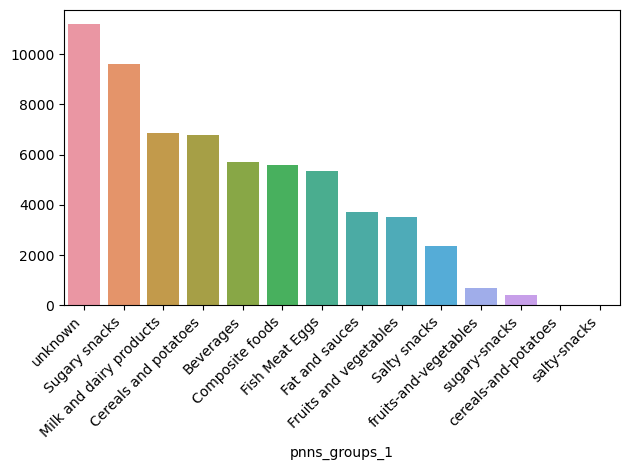

In [32]:
# Comptage des catégories 'pnns_groups_1'
comptage_categorie_pnns1 = df0_F['pnns_groups_1'].value_counts()

# Création du graphique
ax = sns.barplot(x=comptage_categorie_pnns1.index, y=comptage_categorie_pnns1.values)

# Rotation des étiquettes de l'axe des x
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Affichage du graphique
plt.tight_layout()  # Ajuster la disposition pour éviter que les étiquettes ne soient coupées
plt.show()

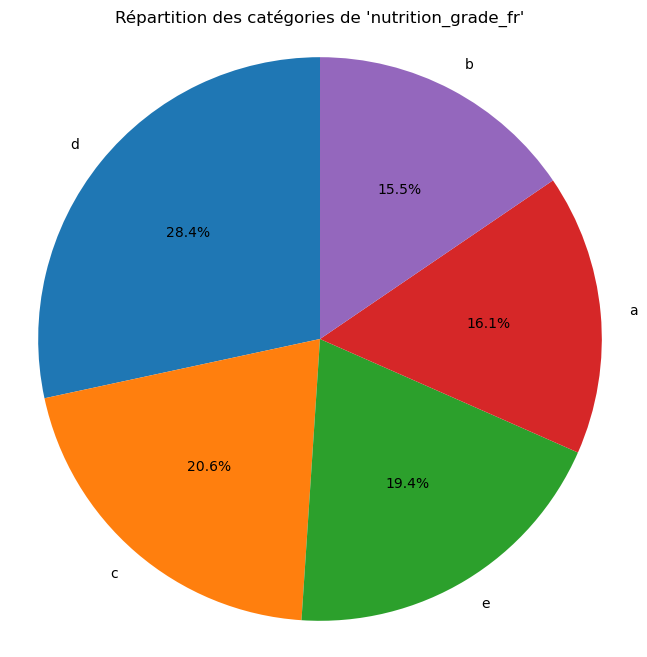

In [33]:
# Comptage des catégories 'nutrition_grade_fr'
comptage_categorie_nutrition_grade_fr = df0_F['nutrition_grade_fr'].value_counts()

# Création du graphique en camembert
plt.figure(figsize=(8, 8))
plt.pie(comptage_categorie_nutrition_grade_fr.values, labels=comptage_categorie_nutrition_grade_fr.index, autopct='%1.1f%%', startangle=90)
plt.title("Répartition des catégories de 'nutrition_grade_fr'")
plt.axis('equal')  # Assure que le camembert est un cercle

# Affichage du graphique
plt.show()

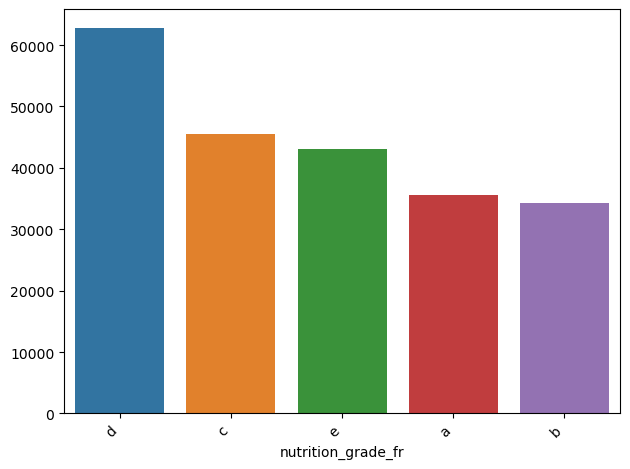

In [34]:
# Comptage des catégories 'nutrition_grade_fr'
comptage_categorie_nutrition_grade_fr = df0_F['nutrition_grade_fr'].value_counts()

# Création du graphique
ax = sns.barplot(x=comptage_categorie_nutrition_grade_fr.index, y=comptage_categorie_nutrition_grade_fr.values)

# Rotation des étiquettes de l'axe des x
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Affichage du graphique
plt.tight_layout()  # Ajuste la disposition pour éviter que les étiquettes ne soient coupées
plt.show()

In [35]:
# Croiser les variables 'pnns_groups_1',  'nutrition_grade_fr', pour voir la distribution des grades d'alimentation par catégorie d'aliment
pd.crosstab(df0_F['pnns_groups_1'], df0_F['nutrition_grade_fr'])

nutrition_grade_fr,a,b,c,d,e
pnns_groups_1,,,,,
Beverages,258,819,1563,907,2150
Cereals and potatoes,3425,1048,1350,852,114
Composite foods,1305,1765,1585,868,70
Fat and sauces,93,243,972,1688,731
Fish Meat Eggs,540,737,1444,1580,1061
Fruits and vegetables,2382,612,463,48,3
Milk and dairy products,637,1377,1696,2886,265
Salty snacks,54,85,667,1183,366
Sugary snacks,68,334,842,3445,4914


# Etape 2: identifiez et traitez les valeurs aberrantes
- identifier les valeurs aberrantes potentielles dans mon ensemble de données ;
- automatiser l'exécution de ma stratégie pour traiter ces valeurs aberrantes de manière appropriée.

In [36]:
# Transférer la colonne 'product_name' en index
df_c = df0_F.set_index('product_name')
df_c

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,,,
Banana Chips Sweetened (Whole),2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129,d,NaN
Peanuts,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,d,NaN
Organic Muesli,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422,c,NaN
Zen Party Mix,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,d,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Natural Cassava,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127,a,NaN
Tartines craquantes bio au sarrasin,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,a,Cereals and potatoes
Amandes,2406.0,3.73,NaN,NaN,NaN,12.2,21.22,0.10000,NaN,NaN,NaN,NaN,b,NaN


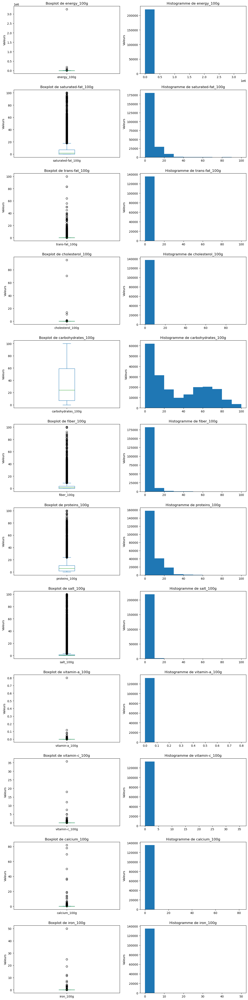

In [37]:
# Représenter graphiquement les valeurs aberrantes 

# Sélectionner uniquement les colonnes numériques
df_numerical = df_c.select_dtypes(include=['int', 'float'])

# Déterminer le nombre de colonnes
num_cols = len(df_numerical.columns)

# Définir la taille de la figure et la disposition de la grille
fig, axs = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols))

# Si num_cols est 1, axs sera une seule instance et non une liste de listes
if num_cols == 1:
    axs = [axs]

# Créer un boxplot et un histogramme pour chaque colonne
for i, col in enumerate(df_numerical.columns):
    # Boxplot
    df_numerical[col].plot(kind='box', ax=axs[i][0])
    axs[i][0].set_title(f'Boxplot de {col}')
    axs[i][0].set_ylabel('Valeurs')
    
    # Histogramme
    df_numerical[col].plot(kind='hist', ax=axs[i][1])
    axs[i][1].set_title(f'Histogramme de {col}')
    axs[i][1].set_ylabel('Valeurs')

# Ajustement automatique des sous-graphes
plt.tight_layout()

# Sauvegarde de la figure combinée en tant qu'image (par exemple, au format PNG)
plt.savefig('combined_graphics.png', bbox_inches='tight')

# Affichage de la figure dans le notebook
plt.show()

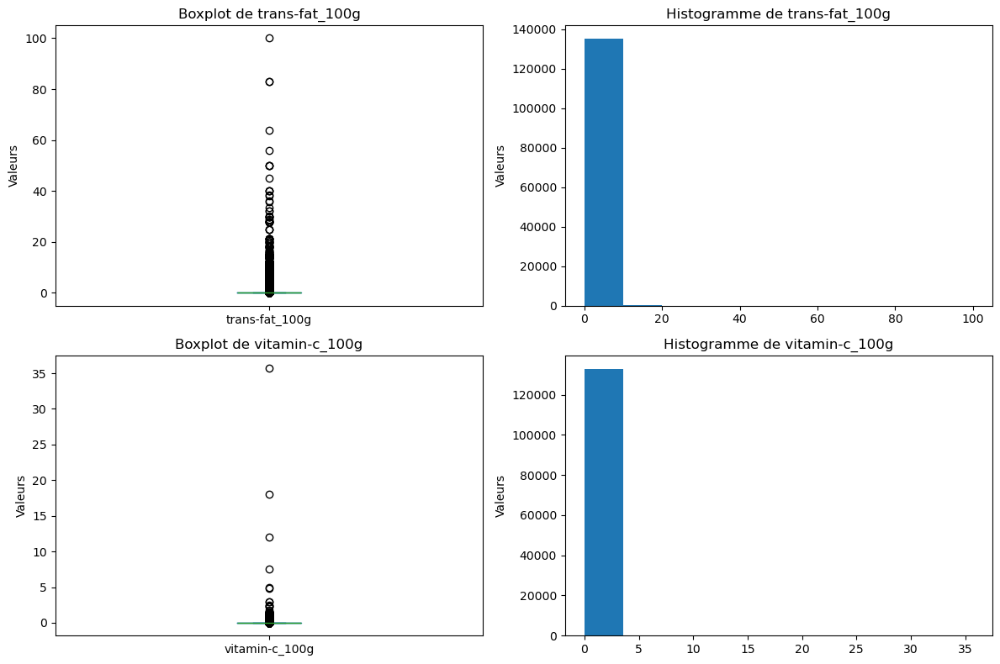

In [39]:
# Afficher des boites à moustache et des histogrammes uniquement pour les variables 'trans-fat_100g', 'vitamin-c_100g'

# Sélectionner uniquement les colonnes spécifiques
columns_to_plot = ['trans-fat_100g', 'vitamin-c_100g']
df_numerical = df_c[columns_to_plot]

# Déterminer le nombre de colonnes
num_cols = len(df_numerical.columns)

# Définir la taille de la figure et la disposition de la grille
fig, axs = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols))

# Si num_cols est 1, axs sera une seule instance et non une liste de listes
if num_cols == 1:
    axs = [axs]

# Créer un boxplot et un histogramme pour chaque colonne
for i, col in enumerate(df_numerical.columns):
    # Boxplot
    df_numerical[col].plot(kind='box', ax=axs[i][0])
    axs[i][0].set_title(f'Boxplot de {col}')
    axs[i][0].set_ylabel('Valeurs')
    
    # Histogramme
    df_numerical[col].plot(kind='hist', ax=axs[i][1])
    axs[i][1].set_title(f'Histogramme de {col}')
    axs[i][1].set_ylabel('Valeurs')

# Ajustement automatique des sous-graphes
plt.tight_layout()

# Sauvegarde de la figure combinée en tant qu'image (par exemple, au format PNG)
plt.savefig('combined_graphics1-3.png', bbox_inches='tight')

# Affichage de la figure dans le notebook
plt.show()

### Traitement des valeurs aberrantes

In [38]:

# détecter les valeurs aberrantes en utilisant les plages interquartiles

# Sélectionner uniquement les colonnes numériques
data_numeriques = df_c.select_dtypes(include=['float64', 'int64'])

# Identifier les outliers avec la méthode des quartiles
Q1 = data_numeriques.quantile(0.25)
Q3 = data_numeriques.quantile(0.75)
IQR = Q3 - Q1
print(IQR)
# Détection des outliers
outliers = (data_numeriques < (Q1 - 1.5 * IQR)) | (data_numeriques > (Q3 + 1.5 * IQR))
data_numeriques[outliers.any(axis=1)]

energy_100g           1264.000000
saturated-fat_100g       7.140000
trans-fat_100g           0.000000
cholesterol_100g         0.020000
carbohydrates_100g      52.000000
fiber_100g               3.600000
proteins_100g            8.810000
salt_100g                1.261440
vitamin-a_100g           0.000102
vitamin-c_100g           0.002800
calcium_100g             0.107000
iron_100g                0.002400
dtype: float64


,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
product_name,,,,,,,,,,,,
Banana Chips Sweetened (Whole),2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.000000,0.0214,0.000,0.00129
Organic Muesli,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422
Cinnamon Nut Granola,1824.0,1.82,NaN,NaN,60.00,9.1,14.55,0.02286,0.000273,NaN,NaN,0.00131
Organic Hazelnuts,2632.0,3.57,NaN,NaN,17.86,10.7,14.29,0.01016,NaN,0.0064,0.107,0.00450
Organic Oat Groats,1096.0,1.19,NaN,NaN,66.67,9.5,16.67,0.02540,NaN,NaN,0.048,0.00429
...,...,...,...,...,...,...,...,...,...,...,...,...
100% Pur Jus 4 agrumes,192.0,0.00,NaN,NaN,10.20,0.6,0.60,0.03000,NaN,0.0240,NaN,NaN
tuna chunks in spring water,444.0,0.00,NaN,NaN,0.00,0.0,25.00,0.76200,NaN,NaN,NaN,NaN
Organic Z Bar,1393.0,2.78,0.0,0.000,61.11,8.3,5.56,0.95250,0.000250,0.0583,0.556,0.00500


In [39]:
# S'assurer que 'product_name' est en index et qu'il est unique
df_c = df_c.reset_index().drop_duplicates(subset='product_name').set_index('product_name')
df_c 

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,,,
Banana Chips Sweetened (Whole),2243.0,28.57,0.0,0.018,64.29,3.6,3.57,0.00000,0.0,0.0214,0.000,0.00129,d,NaN
Peanuts,1941.0,0.00,0.0,0.000,60.71,7.1,17.86,0.63500,0.0,0.0000,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,d,NaN
Organic Muesli,1833.0,4.69,NaN,NaN,57.81,9.4,14.06,0.13970,NaN,NaN,0.062,0.00422,c,NaN
Zen Party Mix,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,d,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fiche Brevet,4.0,1.00,NaN,NaN,NaN,10.0,10.00,10.00000,NaN,NaN,NaN,NaN,b,NaN
Natural Cassava,1477.0,0.00,0.0,0.000,87.06,4.7,1.18,0.03048,0.0,0.0000,0.000,0.00127,a,NaN
Tartines craquantes bio au sarrasin,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,a,Cereals and potatoes


In [40]:
# Traiter les valeurs aberrantes en les supprimant

# Définir la fonction avant de l'utiliser
def traiter_valeurs_aberrantes(df_c):
    # Vérifier l'unicité de l'index
    if not df_c.index.is_unique:
        raise ValueError("L'index 'product_name' doit être unique")

    # Séparer les données numériques des données catégorielles
    data_numerique = df_c.select_dtypes(include=['float64', 'int64'])
    data_catégorielles = df_c.select_dtypes(exclude=['float64', 'int64'])

    # Suppression des valeurs aberrantes basées sur les plages interquartiles pour les données numériques
    Q1 = data_numerique.quantile(0.25)
    Q3 = data_numerique.quantile(0.75)
    IQR = Q3 - Q1

    # Filtrer les valeurs aberrantes pour les données numériques
    mask = ((data_numerique < (Q1 - 1.5 * IQR)) | (data_numerique > (Q3 + 1.5 * IQR))).any(axis=1)
    data_numerique_filtree = data_numerique[~mask]

    # Filtrer les données catégorielles en fonction de l'index des données numériques filtrées
    data_catégorielles_filtree = data_catégorielles.loc[data_numerique_filtree.index]

    # Concaténer les données numériques filtrées avec les données catégorielles
    data_filtree = pd.concat([data_numerique_filtree, data_catégorielles_filtree], axis=1)

    return data_filtree


# Assurer l'unicité de l'index 'product_name'
df_c = df_c.reset_index().drop_duplicates(subset='product_name').set_index('product_name')

# Traitement des valeurs aberrantes pour l'ensemble des données
data_filtree = traiter_valeurs_aberrantes(df_c)
data_filtree

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.0,0.0,60.71,7.1,17.86,0.63500,0.0000,0.0,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,NaN,17.86,7.1,17.86,1.22428,NaN,NaN,0.143,0.00514,d,NaN
Zen Party Mix,2230.0,5.00,NaN,NaN,36.67,6.7,16.67,1.60782,NaN,NaN,0.133,0.00360,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,NaN,NaN,46.67,6.7,13.33,0.46482,0.0001,NaN,0.067,0.00240,d,NaN
Peanut Butter Power Chews,1954.0,2.22,NaN,NaN,60.00,4.4,8.89,0.19812,NaN,NaN,0.089,0.00160,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Verrine Cheescake Myrtille,1084.0,12.00,NaN,NaN,NaN,0.0,8.70,0.29000,NaN,NaN,NaN,NaN,d,NaN
Natural Cassava,1477.0,0.00,0.0,0.0,87.06,4.7,1.18,0.03048,0.0000,0.0,0.000,0.00127,a,NaN
Tartines craquantes bio au sarrasin,1643.0,0.60,NaN,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,NaN,0.00380,a,Cereals and potatoes


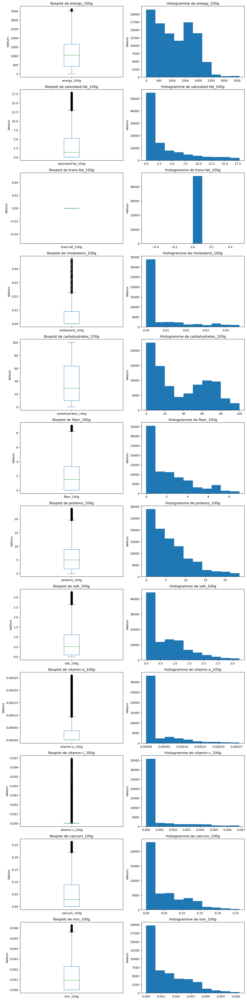

In [43]:
# Vérification des données après suppression des valeurs aberrantes en créant des boxplots et des histogrammes

# Sélectionner uniquement les colonnes numériques
df_numerical = data_filtree.select_dtypes(include=['int', 'float'])

# Déterminer le nombre de colonnes
num_cols = len(df_numerical.columns)

# Définir la taille de la figure et la disposition de la grille
fig, axs = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols))

# Si num_cols est 1, axs sera une seule instance et non une liste de listes
if num_cols == 1:
    axs = [axs]

# Créer un boxplot et un histogramme pour chaque colonne
for i, col in enumerate(df_numerical.columns):
    # Boxplot
    df_numerical[col].plot(kind='box', ax=axs[i][0])
    axs[i][0].set_title(f'Boxplot de {col}')
    axs[i][0].set_ylabel('Valeurs')
    
    # Histogramme
    df_numerical[col].plot(kind='hist', ax=axs[i][1])
    axs[i][1].set_title(f'Histogramme de {col}')
    axs[i][1].set_ylabel('Valeurs')

# Ajustement automatique des sous-graphes
plt.tight_layout()

# Sauvegarde de la figure combinée en tant qu'image 
plt.savefig('combined_graphics2.png', bbox_inches='tight')

# Affichage de la figure dans le notebook
plt.show()

In [44]:
# Statistiques descriptives des données après suppression des valeurs aberrantes
data_filtree.describe()

,energy_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
count,101281.000000,101281.000000,47337.0,47831.000000,89622.000000,85335.000000,101281.000000,101281.000000,45313.000000,45183.000000,47134.000000,46271.000000
mean,1086.278158,3.378823,0.0,0.006636,36.428604,2.039863,6.016540,0.705637,0.000027,0.000644,0.049697,0.001295
std,711.905037,4.453618,0.0,0.011978,28.816476,2.227171,5.329073,0.725628,0.000051,0.001452,0.057920,0.001371
min,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,420.000000,0.000000,0.0,0.000000,9.780000,0.000000,1.650000,0.090000,0.000000,0.000000,0.000000,0.000000
50%,1046.000000,1.340000,0.0,0.000000,29.000000,1.490000,5.000000,0.508000,0.000000,0.000000,0.029000,0.000920
75%,1653.000000,5.200000,0.0,0.009000,63.160000,3.300000,8.820000,1.112520,0.000037,0.000000,0.088000,0.002260
max,3590.000000,17.840000,0.0,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.006900,0.261000,0.006260


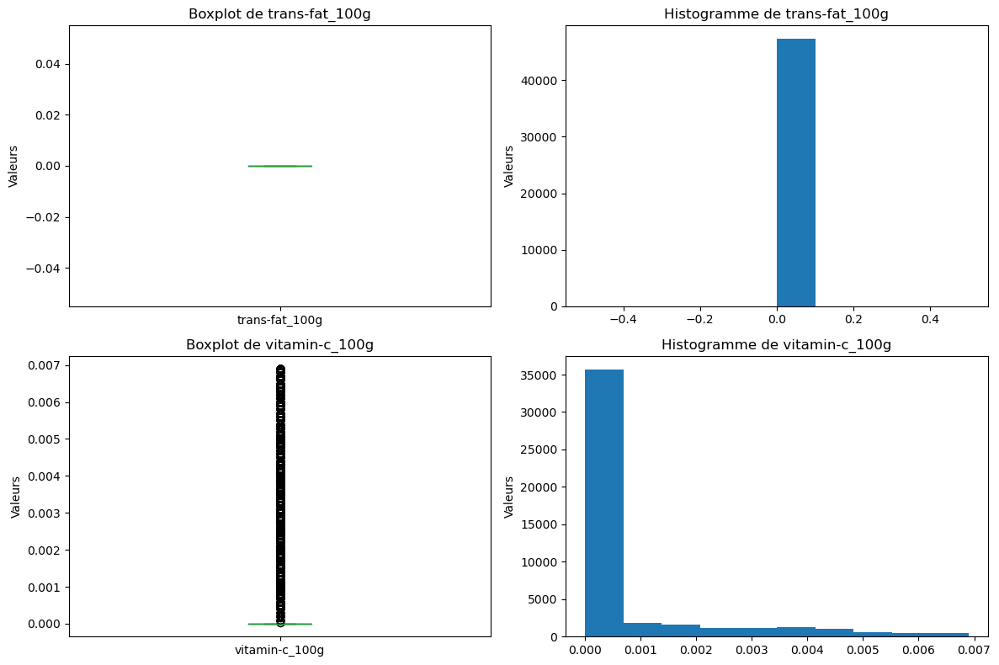

In [45]:
# Afficher les boites à moustache et les histogrammes après suppression des valeurs aberrantes pour les variables 'trans-fat_100g', 'vitamin-c_100g'

# Sélectionner uniquement les colonnes spécifiques
columns_to_plot = ['trans-fat_100g', 'vitamin-c_100g']
df_numerical = data_filtree[columns_to_plot]

# Déterminer le nombre de colonnes
num_cols = len(df_numerical.columns)

# Définir la taille de la figure et la disposition de la grille
fig, axs = plt.subplots(num_cols, 2, figsize=(12, 4 * num_cols))

# Si num_cols est 1, axs sera une seule instance et non une liste de listes
if num_cols == 1:
    axs = [axs]

# Créer un boxplot et un histogramme pour chaque colonne
for i, col in enumerate(df_numerical.columns):
    # Boxplot
    df_numerical[col].plot(kind='box', ax=axs[i][0])
    axs[i][0].set_title(f'Boxplot de {col}')
    axs[i][0].set_ylabel('Valeurs')
    
    # Histogramme
    df_numerical[col].plot(kind='hist', ax=axs[i][1])
    axs[i][1].set_title(f'Histogramme de {col}')
    axs[i][1].set_ylabel('Valeurs')

# Ajustement automatique des sous-graphes
plt.tight_layout()

# Sauvegarde de la figure combinée en tant qu'image (par exemple, au format PNG)
plt.savefig('combined_graphics3-2.png', bbox_inches='tight')

# Affichage de la figure dans le notebook
plt.show()

In [46]:
# Supprimer la variable constante et nulle 'trans-fat_100g', et la variable quasiment nulle avec beaucoup de valeurs aberrantes'vitamin-c_100g' 

data_filtree1 = data_filtree.drop(['trans-fat_100g', 'vitamin-c_100g'], axis=1)
data_filtree1

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.0,60.71,7.1,17.86,0.63500,0.0000,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,17.86,7.1,17.86,1.22428,NaN,0.143,0.00514,d,NaN
Zen Party Mix,2230.0,5.00,NaN,36.67,6.7,16.67,1.60782,NaN,0.133,0.00360,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,NaN,46.67,6.7,13.33,0.46482,0.0001,0.067,0.00240,d,NaN
Peanut Butter Power Chews,1954.0,2.22,NaN,60.00,4.4,8.89,0.19812,NaN,0.089,0.00160,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Verrine Cheescake Myrtille,1084.0,12.00,NaN,NaN,0.0,8.70,0.29000,NaN,NaN,NaN,d,NaN
Natural Cassava,1477.0,0.00,0.0,87.06,4.7,1.18,0.03048,0.0000,0.000,0.00127,a,NaN
Tartines craquantes bio au sarrasin,1643.0,0.60,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,0.00380,a,Cereals and potatoes


In [47]:
# Statistiques descriptives
data_filtree1.describe()

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101281.000000,101281.000000,47831.000000,89622.000000,85335.000000,101281.000000,101281.000000,45313.000000,47134.000000,46271.000000
mean,1086.278158,3.378823,0.006636,36.428604,2.039863,6.016540,0.705637,0.000027,0.049697,0.001295
std,711.905037,4.453618,0.011978,28.816476,2.227171,5.329073,0.725628,0.000051,0.057920,0.001371
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,420.000000,0.000000,0.000000,9.780000,0.000000,1.650000,0.090000,0.000000,0.000000,0.000000
50%,1046.000000,1.340000,0.000000,29.000000,1.490000,5.000000,0.508000,0.000000,0.029000,0.000920
75%,1653.000000,5.200000,0.009000,63.160000,3.300000,8.820000,1.112520,0.000037,0.088000,0.002260
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


## Etape 3 : Identifiez et traitez les valeurs manquantes
- identifier les valeurs manquantes dans mon ensemble de données ;- 
appliqeré des méthodes appropriées pour traiter ces valeurs de manière adéquate.

In [49]:
# Identifier les valeurs manquantes
valeurs_manquantes = data_filtree1.isnull().sum()
valeurs_manquantes

energy_100g             163
saturated-fat_100g      163
cholesterol_100g      53613
carbohydrates_100g    11822
fiber_100g            16109
proteins_100g           163
salt_100g               163
vitamin-a_100g        56131
calcium_100g          54310
iron_100g             55173
nutrition_grade_fr        0
pnns_groups_1         61616
dtype: int64

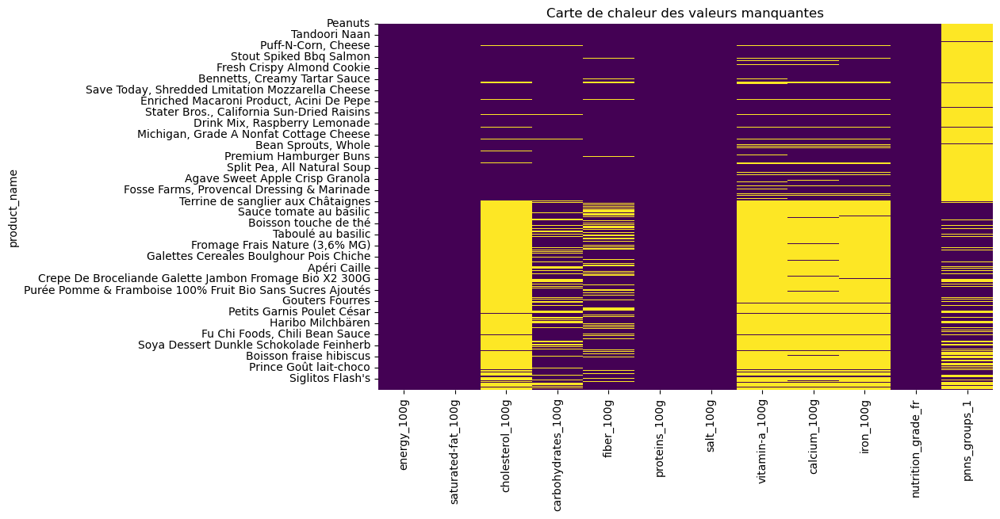

In [50]:
# Analyse des motifs des valeurs manquantes
# Visualiser les valeurs manquantes avec une carte de chaleur
plt.figure(figsize=(10, 6))
sns.heatmap(data_filtree1.isnull(), cbar=False, cmap='viridis')
plt.title('Carte de chaleur des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('carte_chaleur_valeurs_manquantes.png', bbox_inches='tight')
# Afficher la carte de chaleur des valeurs manquantes
plt.show()

In [110]:
# Supprimer les lignes contenant uniquement des NaN

# Sélectionner uniquement les colonnes numériques
colonnes_numeriques = data_filtree1.select_dtypes(include='number').columns

# Supprimer les lignes où toutes les colonnes numériques sont NaN
data_filtree2 = data_filtree1.dropna(subset=colonnes_numeriques, how='all')
data_filtree2

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.0,60.71,7.1,17.86,0.63500,0.0000,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,17.86,7.1,17.86,1.22428,NaN,0.143,0.00514,d,NaN
Zen Party Mix,2230.0,5.00,NaN,36.67,6.7,16.67,1.60782,NaN,0.133,0.00360,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,NaN,46.67,6.7,13.33,0.46482,0.0001,0.067,0.00240,d,NaN
Peanut Butter Power Chews,1954.0,2.22,NaN,60.00,4.4,8.89,0.19812,NaN,0.089,0.00160,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Verrine Cheescake Myrtille,1084.0,12.00,NaN,NaN,0.0,8.70,0.29000,NaN,NaN,NaN,d,NaN
Natural Cassava,1477.0,0.00,0.0,87.06,4.7,1.18,0.03048,0.0000,0.000,0.00127,a,NaN
Tartines craquantes bio au sarrasin,1643.0,0.60,NaN,74.80,5.9,13.00,0.68000,NaN,NaN,0.00380,a,Cereals and potatoes


In [87]:
# Statistiques descriptives
data_filtree2.describe()

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101281.000000,101281.000000,47831.000000,89622.000000,85335.000000,101281.000000,101281.000000,45313.000000,47134.000000,46271.000000
mean,1086.278158,3.378823,0.006636,36.428604,2.039863,6.016540,0.705637,0.000027,0.049697,0.001295
std,711.905037,4.453618,0.011978,28.816476,2.227171,5.329073,0.725628,0.000051,0.057920,0.001371
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,420.000000,0.000000,0.000000,9.780000,0.000000,1.650000,0.090000,0.000000,0.000000,0.000000
50%,1046.000000,1.340000,0.000000,29.000000,1.490000,5.000000,0.508000,0.000000,0.029000,0.000920
75%,1653.000000,5.200000,0.009000,63.160000,3.300000,8.820000,1.112520,0.000037,0.088000,0.002260
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


In [111]:
# Supprimer les lignes contenant uniquement des zéros

# Sélectionner uniquement les colonnes numériques
colonnes_numeriques = data_filtree2.select_dtypes(include='number').columns

# Créer un masque pour les lignes où toutes les colonnes numériques sont des zéros
mask = (data_filtree2[colonnes_numeriques] != 0).any(axis=1)

# Appliquer le masque pour filtrer les lignes
data_filtree3 = data_filtree2[mask]

# Afficher le DataFrame filtré
data_filtree3

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.0,60.71,7.1,17.86,0.63500,0.0000,0.071,0.00129,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,17.86,7.1,17.86,1.22428,NaN,0.143,0.00514,d,NaN
Zen Party Mix,2230.0,5.00,NaN,36.67,6.7,16.67,1.60782,NaN,0.133,0.00360,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,NaN,46.67,6.7,13.33,0.46482,0.0001,0.067,0.00240,d,NaN
Peanut Butter Power Chews,1954.0,2.22,NaN,60.00,4.4,8.89,0.19812,NaN,0.089,0.00160,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Nature cheddar and red onion crisps,2155.0,3.40,NaN,NaN,5.6,7.80,1.35000,NaN,NaN,NaN,c,Salty snacks
Verrine Cheescake Myrtille,1084.0,12.00,NaN,NaN,0.0,8.70,0.29000,NaN,NaN,NaN,d,NaN
Natural Cassava,1477.0,0.00,0.0,87.06,4.7,1.18,0.03048,0.0000,0.000,0.00127,a,NaN


In [89]:
data_filtree3.describe()

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101080.000000,101080.000000,47630.000000,89421.000000,85134.000000,101080.000000,101080.000000,45112.000000,46933.000000,46070.000000
mean,1088.438248,3.385542,0.006664,36.510488,2.044679,6.028504,0.707040,0.000027,0.049910,0.001300
std,710.960931,4.455492,0.011995,28.796982,2.227589,5.327604,0.725666,0.000051,0.057952,0.001372
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,423.000000,0.000000,0.000000,9.900000,0.000000,1.670000,0.091440,0.000000,0.000000,0.000000
50%,1046.000000,1.400000,0.000000,29.170000,1.500000,5.000000,0.508000,0.000000,0.030000,0.000940
75%,1653.000000,5.200000,0.009000,63.160000,3.300000,8.850000,1.115060,0.000037,0.088000,0.002290
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


In [112]:
# Filtrer les lignes qui ont une catégorie pnns_groups_1 non nulle
data_filtered = data_filtree3[data_filtree['pnns_groups_1'].notna()]
data_filtered

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_27792\3184037034.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_filtered = data_filtree3[data_filtree['pnns_groups_1'].notna()]


,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Lion Peanut x2,1883.0,12.500,0.0120,70.00,2.500,2.500,0.09652,NaN,0.1000,0.000900,e,unknown
Pain Burger Artisan,1160.0,0.333,0.0000,53.30,2.220,10.000,1.52000,0.000000,0.0222,0.006000,b,unknown
Quiche Lorraine,478.0,2.860,0.0107,7.86,0.357,5.360,0.49900,0.000011,0.0286,0.000643,b,Composite foods
Luxury Christmas Pudding,1284.0,3.600,NaN,54.20,4.700,3.900,0.20000,NaN,NaN,NaN,c,unknown
"Pepsi, Nouveau goût !",177.0,0.000,NaN,10.40,0.000,0.000,0.02540,NaN,NaN,NaN,e,Beverages
...,...,...,...,...,...,...,...,...,...,...,...,...
Santa Cruz Chilli & Lime Dressing,660.0,0.500,NaN,23.10,0.600,0.300,0.54102,NaN,NaN,NaN,c,Fat and sauces
Fisherman's Friend Miel-Citron,1031.0,1.280,NaN,95.31,1.470,0.004,0.00100,NaN,NaN,NaN,b,Sugary snacks
Nature cheddar and red onion crisps,2155.0,3.400,NaN,NaN,5.600,7.800,1.35000,NaN,NaN,NaN,c,Salty snacks


In [113]:
# Imputation des valeurs manquantes qui ont une catégorie pnns_groups_1 avec la méthode KNNI

# Créer une copie du DataFrame original
data_filtree3_original = data_filtree3.copy()

# Filtrer les lignes qui ont une catégorie pnns_groups_1 non nulle
data_filtered = data_filtree3[data_filtree3['pnns_groups_1'].notna()]

# Séparer les colonnes numériques et catégorielles
colonnes_numeriques = data_filtered.select_dtypes(include=[np.number]).columns
colonnes_categorielles = data_filtered.select_dtypes(exclude=[np.number]).columns

# Imputation des valeurs manquantes avec le KNN Imputer
imputer_knn = KNNImputer(n_neighbors=5)  # Vous pouvez ajuster le nombre de voisins
data_imputed_numerique = imputer_knn.fit_transform(data_filtered[colonnes_numeriques])

# Convertir les données imputées en DataFrame et conserver l'index original
data_imputed_numerique_df = pd.DataFrame(data_imputed_numerique, columns=colonnes_numeriques, index=data_filtered.index)

# S'assurer que toutes les valeurs sont non négatives
data_imputed_numerique_df[data_imputed_numerique_df < 0] = 0

# Concaténer les colonnes numériques imputées et les colonnes catégorielles d'origine
data_imputed = pd.concat([data_imputed_numerique_df, data_filtered[colonnes_categorielles]], axis=1)

# Mettre à jour le DataFrame original avec les valeurs imputées
data_filtree3.update(data_imputed)

# Vérifier les valeurs manquantes dans le DataFrame final
print(data_filtree3.isnull().sum())

# Afficher le DataFrame final
data_filtree3

energy_100g               0
saturated-fat_100g        0
cholesterol_100g      14649
carbohydrates_100g     9537
fiber_100g             2213
proteins_100g             0
salt_100g                 0
vitamin-a_100g        16978
calcium_100g          16401
iron_100g             16279
nutrition_grade_fr        0
pnns_groups_1         61414
dtype: int64


,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.00000,60.71,7.1,17.86,0.63500,0.000000,0.071000,0.001290,b,NaN
Organic Salted Nut Mix,2540.0,5.36,NaN,17.86,7.1,17.86,1.22428,NaN,0.143000,0.005140,d,NaN
Zen Party Mix,2230.0,5.00,NaN,36.67,6.7,16.67,1.60782,NaN,0.133000,0.003600,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,NaN,46.67,6.7,13.33,0.46482,0.000100,0.067000,0.002400,d,NaN
Peanut Butter Power Chews,1954.0,2.22,NaN,60.00,4.4,8.89,0.19812,NaN,0.089000,0.001600,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Nature cheddar and red onion crisps,2155.0,3.40,0.00236,50.28,5.6,7.80,1.35000,0.000000,0.089040,0.001693,c,Salty snacks
Verrine Cheescake Myrtille,1084.0,12.00,NaN,NaN,0.0,8.70,0.29000,NaN,NaN,NaN,d,NaN
Natural Cassava,1477.0,0.00,0.00000,87.06,4.7,1.18,0.03048,0.000000,0.000000,0.001270,a,NaN


In [114]:
data_filtree3.describe()

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101080.000000,101080.000000,86431.000000,91543.000000,98867.000000,101080.000000,101080.000000,84102.000000,84679.000000,84801.000000
mean,1088.438248,3.385542,0.006013,36.337848,1.974779,6.028504,0.707040,0.000031,0.068203,0.001425
std,710.960931,4.455492,0.009679,28.789289,2.135615,5.327604,0.725666,0.000043,0.056269,0.001274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,423.000000,0.000000,0.000000,9.800000,0.000000,1.670000,0.091440,0.000000,0.011000,0.000300
50%,1046.000000,1.400000,0.000834,28.790000,1.400000,5.000000,0.508000,0.000011,0.067000,0.001200
75%,1653.000000,5.200000,0.008540,63.000000,3.160000,8.850000,1.115060,0.000048,0.112200,0.002300
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


In [115]:
# Remplir les valeurs manquantes restantes par 0 dans les colonnes numériques uniquement
data_filtree3[colonnes_numeriques] = data_filtree3[colonnes_numeriques].fillna(0)

# Vérifier les valeurs manquantes dans le DataFrame final
print(data_filtree3.isnull().sum())

# Afficher le DataFrame final
data_filtree3

energy_100g               0
saturated-fat_100g        0
cholesterol_100g          0
carbohydrates_100g        0
fiber_100g                0
proteins_100g             0
salt_100g                 0
vitamin-a_100g            0
calcium_100g              0
iron_100g                 0
nutrition_grade_fr        0
pnns_groups_1         61414
dtype: int64


C:\Users\SOUKA\AppData\Local\Temp\ipykernel_27792\550464076.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtree3[colonnes_numeriques] = data_filtree3[colonnes_numeriques].fillna(0)


,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,pnns_groups_1
product_name,,,,,,,,,,,,
Peanuts,1941.0,0.00,0.00000,60.71,7.1,17.86,0.63500,0.000000,0.071000,0.001290,b,NaN
Organic Salted Nut Mix,2540.0,5.36,0.00000,17.86,7.1,17.86,1.22428,0.000000,0.143000,0.005140,d,NaN
Zen Party Mix,2230.0,5.00,0.00000,36.67,6.7,16.67,1.60782,0.000000,0.133000,0.003600,d,NaN
Antioxidant Mix - Berries & Chocolate,2092.0,6.67,0.00000,46.67,6.7,13.33,0.46482,0.000100,0.067000,0.002400,d,NaN
Peanut Butter Power Chews,1954.0,2.22,0.00000,60.00,4.4,8.89,0.19812,0.000000,0.089000,0.001600,c,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
Nature cheddar and red onion crisps,2155.0,3.40,0.00236,50.28,5.6,7.80,1.35000,0.000000,0.089040,0.001693,c,Salty snacks
Verrine Cheescake Myrtille,1084.0,12.00,0.00000,0.00,0.0,8.70,0.29000,0.000000,0.000000,0.000000,d,NaN
Natural Cassava,1477.0,0.00,0.00000,87.06,4.7,1.18,0.03048,0.000000,0.000000,0.001270,a,NaN


In [116]:
data_filtree3.describe()

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000
mean,1088.438248,3.385542,0.005141,32.909335,1.931544,6.028504,0.707040,0.000025,0.057136,0.001196
std,710.960931,4.455492,0.009197,29.384576,2.131785,5.327604,0.725666,0.000041,0.057313,0.001279
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,423.000000,0.000000,0.000000,5.830000,0.000000,1.670000,0.091440,0.000000,0.000000,0.000000
50%,1046.000000,1.400000,0.000000,23.000000,1.340000,5.000000,0.508000,0.000000,0.048000,0.000840
75%,1653.000000,5.200000,0.007000,60.470000,3.100000,8.850000,1.115060,0.000040,0.102445,0.002030
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


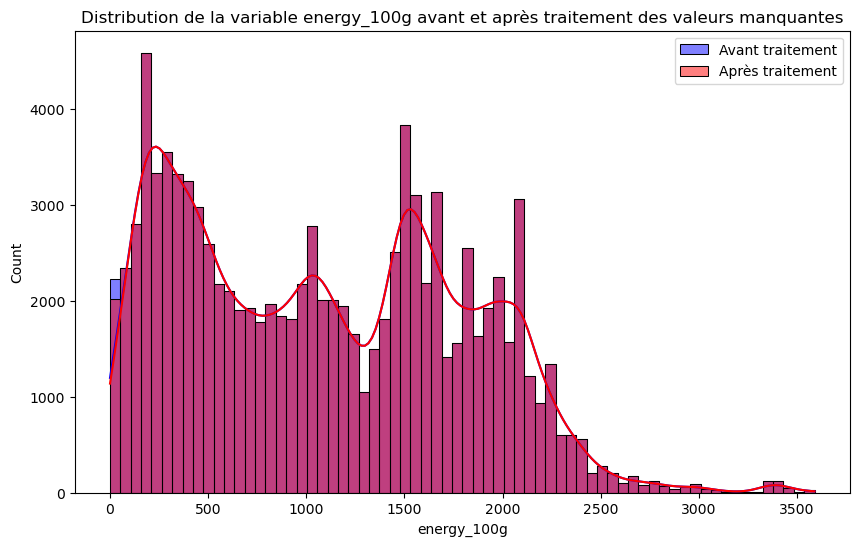

In [117]:
# Comparer la distribution des variables avant et après traitement des valeurs manquantes

# Comparer la distribution du variable  'energy_100g' avant et après l'imputation et mise à 0 
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['energy_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['energy_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable energy_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_energy_100g.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


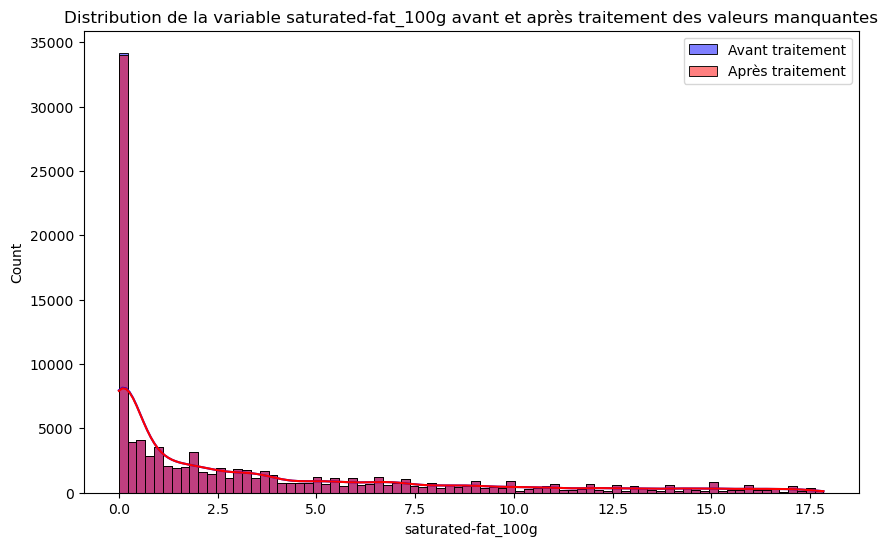

In [106]:
# Comparer la distribution des variables avant et après traitement des valeurs manquantes

# Comparer la distribution du variable  'saturated-fat_100g' avant et après l'imputation et mise à 0 
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['saturated-fat_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['saturated-fat_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable saturated-fat_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_saturated-fat_100g.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


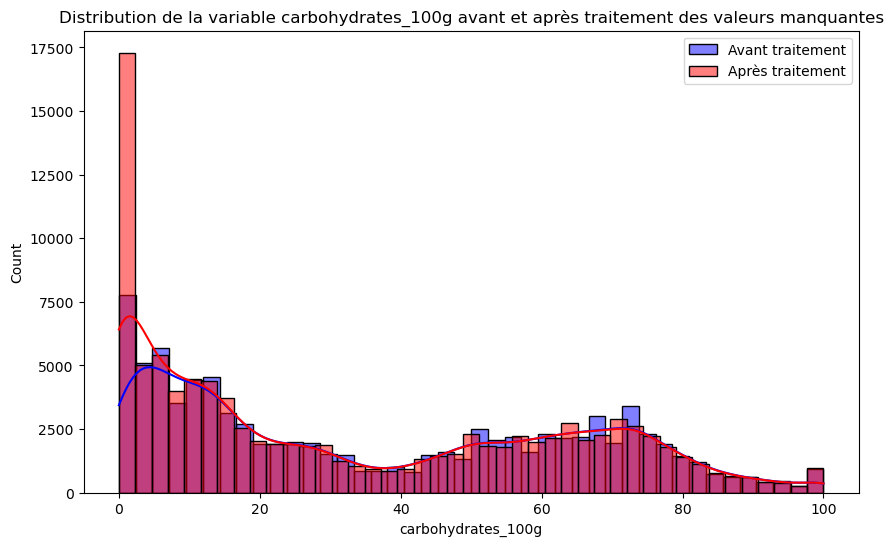

In [99]:
# Comparer la distribution des variables avant et après traitement des valeurs manquantes

# Comparer la distribution du variable  'carbohydrates_100g' avant et après l'imputation et mise à 0 
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['carbohydrates_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['carbohydrates_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable carbohydrates_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_carbohydrates_100g.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


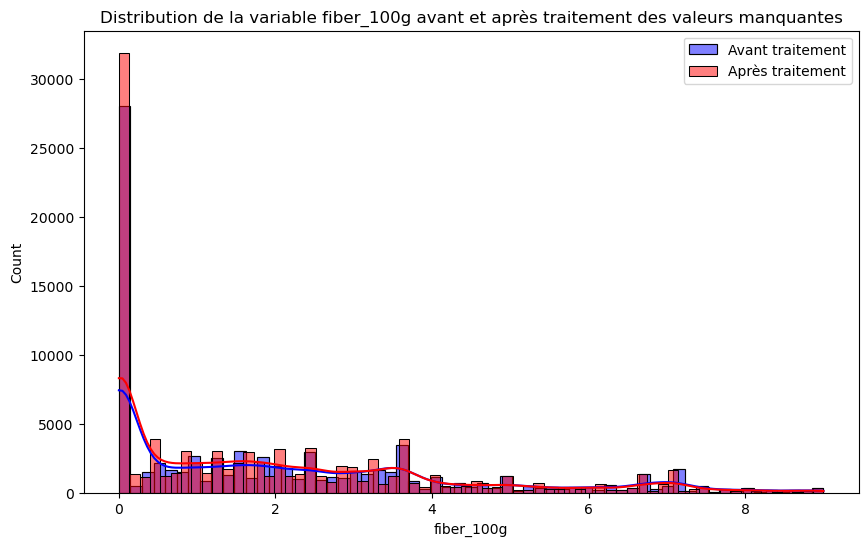

In [100]:
# Comparer la distribution du variable  'fiber_100g' avant et après traitement
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['fiber_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['fiber_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable fiber_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_fiber_100g.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


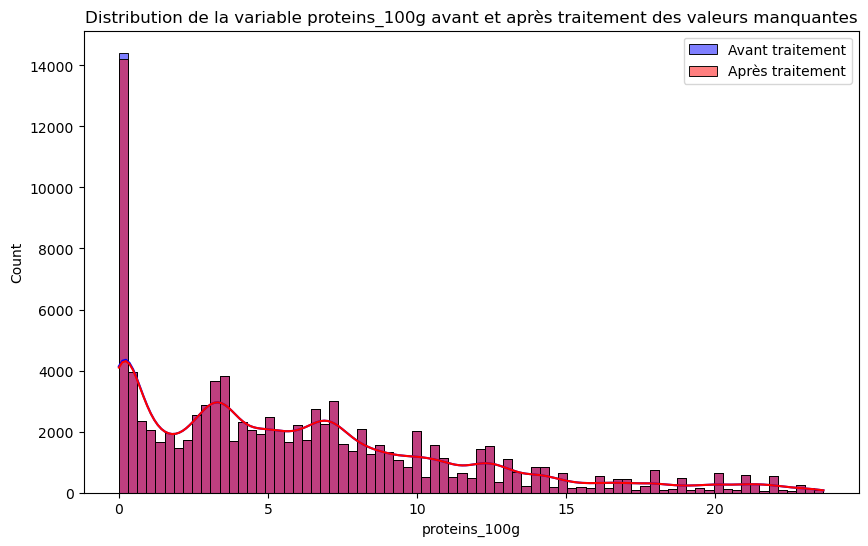

In [107]:
# Comparer la distribution du variable  'proteins_100g' avant et après traitement
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['proteins_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['proteins_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable proteins_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_proteins_100gg.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


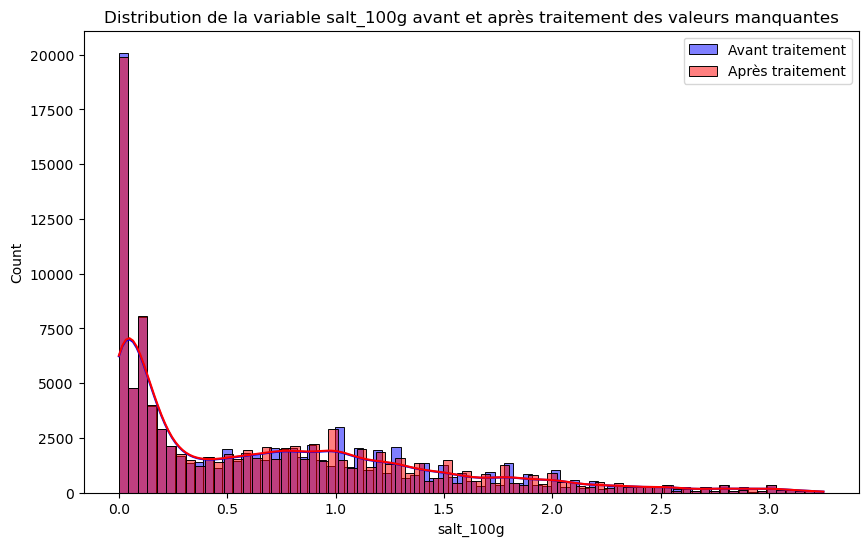

In [108]:
# Comparer la distribution du variable  'salt_100g' avant et après traitement
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['salt_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['salt_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable salt_100g avant et après traitement des valeurs manquantes')
# Sauvegarde de la figure en tant qu'image 
plt.savefig('distribution_salt_100g.png', bbox_inches='tight')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


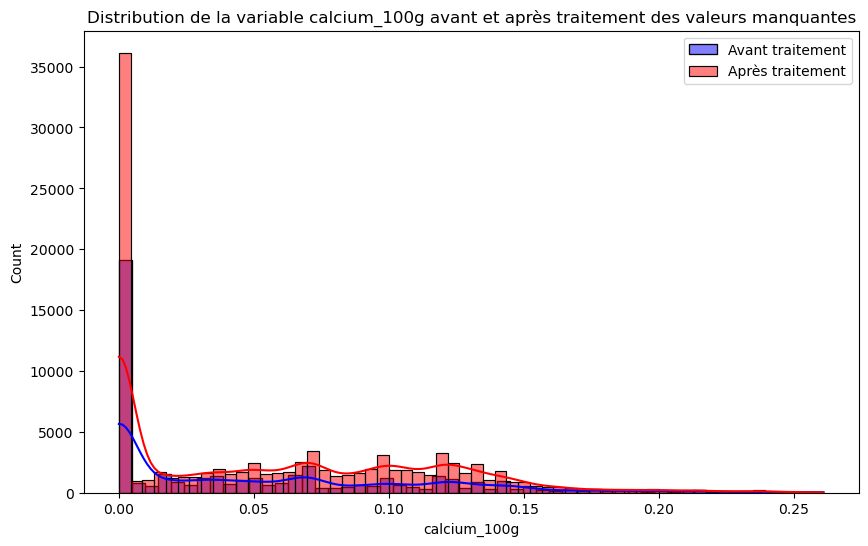

In [101]:
# Comparer la distribution du variable 'calcium_100g' avant et après traitement
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['calcium_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['calcium_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable calcium_100g avant et après traitement des valeurs manquantes')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


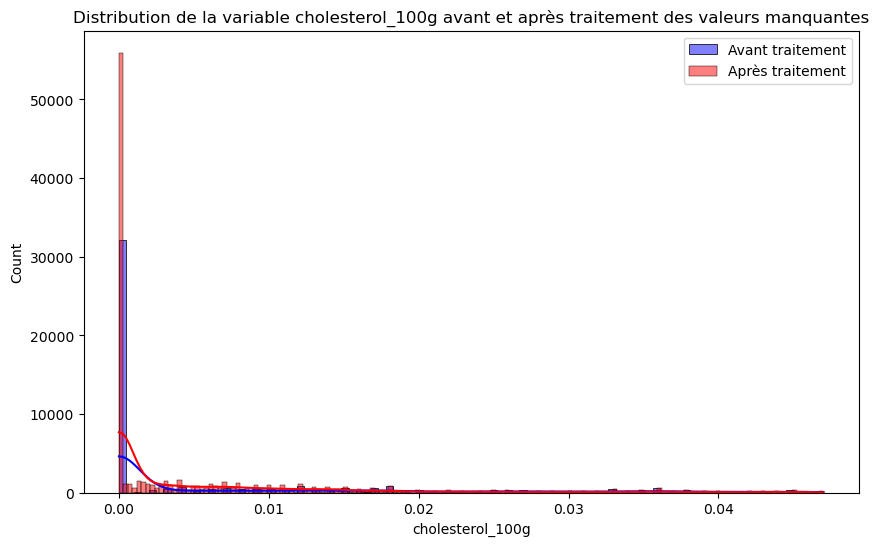

In [102]:
# Comparer la distribution du variable 'cholesterol_100g' avant et après traitement
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['cholesterol_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['cholesterol_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable cholesterol_100g avant et après traitement des valeurs manquantes')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


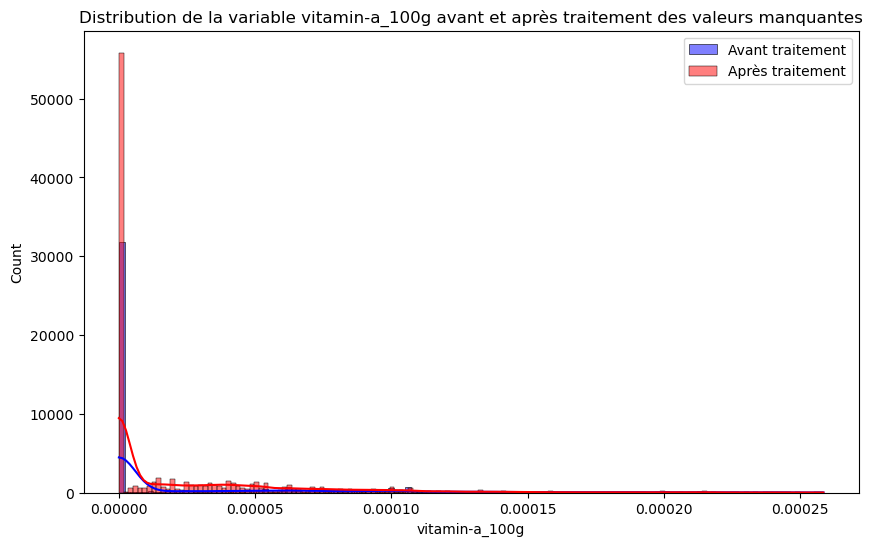

In [103]:

# Comparer la distribution du variable 'vitamin-a_100g' avant et après traitement des valeurs manquantes

plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['vitamin-a_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['vitamin-a_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable vitamin-a_100g avant et après traitement des valeurs manquantes')
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


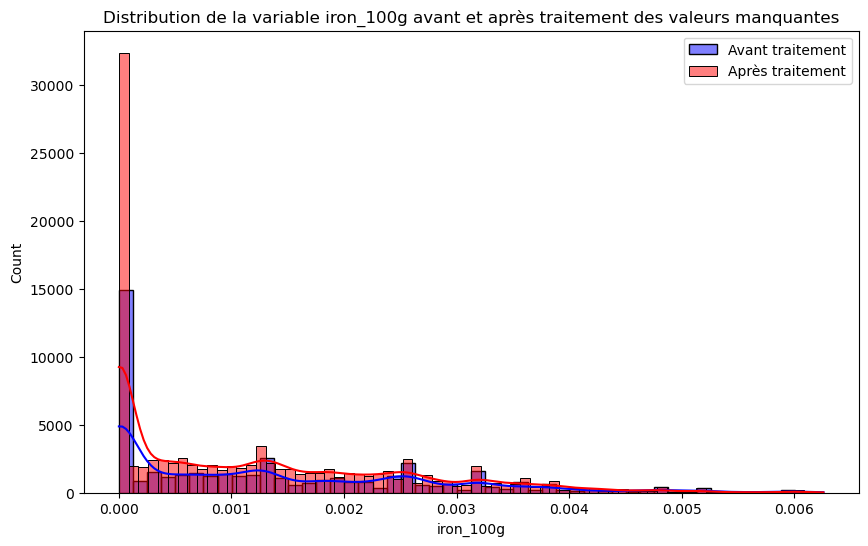

In [104]:
# Comparer la distribution du variable 'iron_100g' avant et après traitement des valeurs manquantes
plt.figure(figsize=(10, 6))
sns.histplot(data_filtree1['iron_100g'], color='blue', label='Avant traitement', kde=True)
sns.histplot(data_filtree3['iron_100g'], color='red', label='Après traitement', kde=True)
plt.legend()
plt.title('Distribution de la variable iron_100g avant et après traitement des valeurs manquantes')
plt.show()

## Etape 4 : Effectuez les analyses uni-variée et bi-variée
- réaliser une analyse univariée complète de chaque feature (variable) de mon ensemble de données ;
- réaliser une analyse bivariée pour étudier les relations entre différentes paires de features..

### 4.1 Analyse univariée: Statistiques descriptives

In [119]:
# Statistiques descriptives
statistiques_descriptives = data_filtree3.describe()
statistiques_descriptives

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
count,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000,101080.000000
mean,1088.438248,3.385542,0.005141,32.909335,1.931544,6.028504,0.707040,0.000025,0.057136,0.001196
std,710.960931,4.455492,0.009197,29.384576,2.131785,5.327604,0.725666,0.000041,0.057313,0.001279
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,423.000000,0.000000,0.000000,5.830000,0.000000,1.670000,0.091440,0.000000,0.000000,0.000000
50%,1046.000000,1.400000,0.000000,23.000000,1.340000,5.000000,0.508000,0.000000,0.048000,0.000840
75%,1653.000000,5.200000,0.007000,60.470000,3.100000,8.850000,1.115060,0.000040,0.102445,0.002030
max,3590.000000,17.840000,0.047000,100.000000,9.000000,23.640000,3.251200,0.000259,0.261000,0.006260


### 4.2 Analyse univariée: Visualisations univariées

Colonnes constantes : []


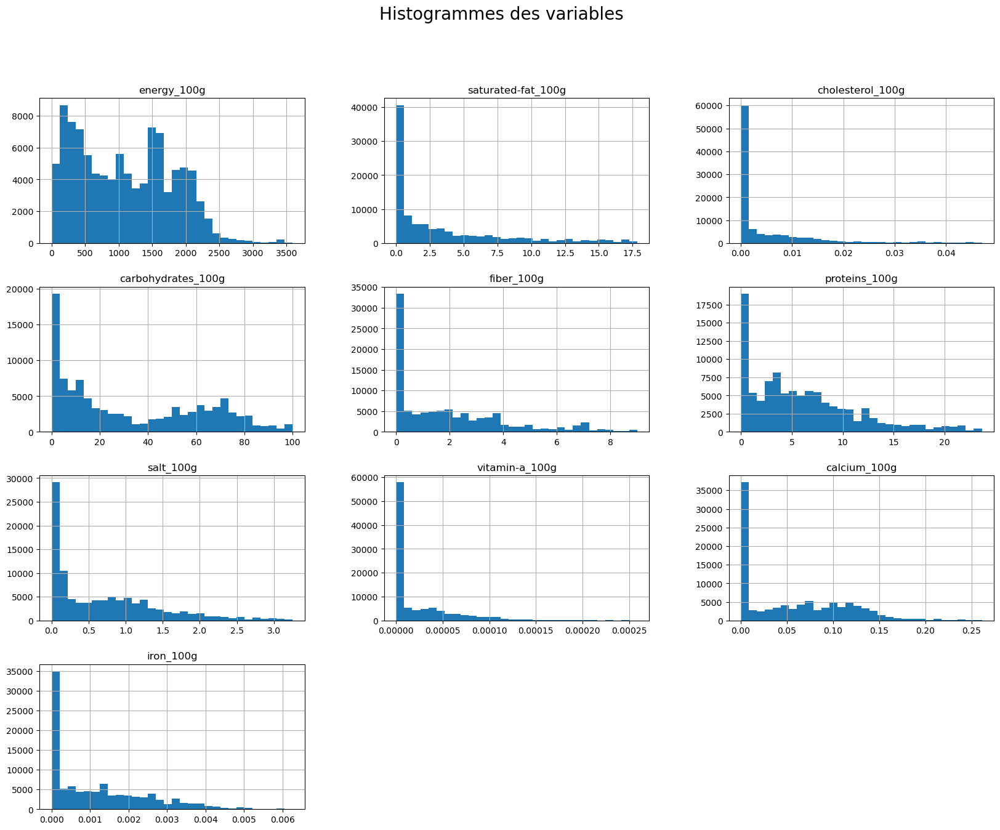

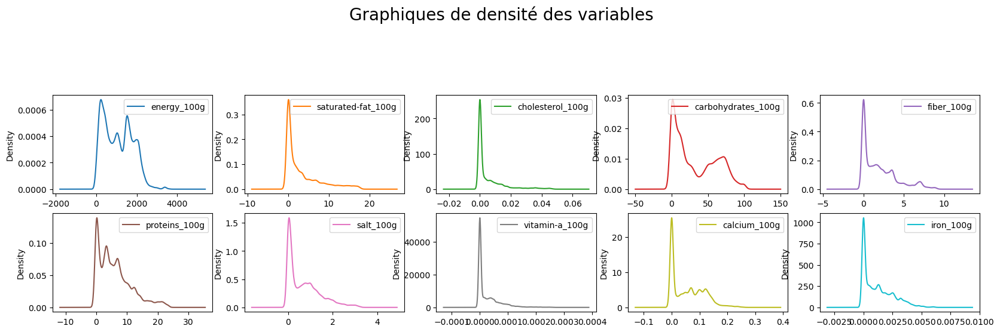

In [120]:
# Créer des histogrammes et graphiques de densité pour chaque variable

# Vérifier les colonnes constantes
constant_columns = [col for col in data_filtree3.columns if data_filtree3[col].nunique() == 1]
print(f"Colonnes constantes : {constant_columns}")

# Supprimer les colonnes constantes
data_filtree3 = data_filtree3.drop(columns=constant_columns)

# Histogrammes
data_filtree3.hist(figsize=(20, 15), bins=30)
plt.suptitle('Histogrammes des variables', fontsize=20)
plt.show()


# Graphiques de densité
try:
    data_filtree3.plot(kind='density', subplots=True, layout=(6, 5), sharex=False, figsize=(20, 15))
    plt.suptitle('Graphiques de densité des variables', fontsize=20)
    plt.show()
except Exception as e:
    print(f"Erreur lors de la génération des graphiques de densité : {e}")

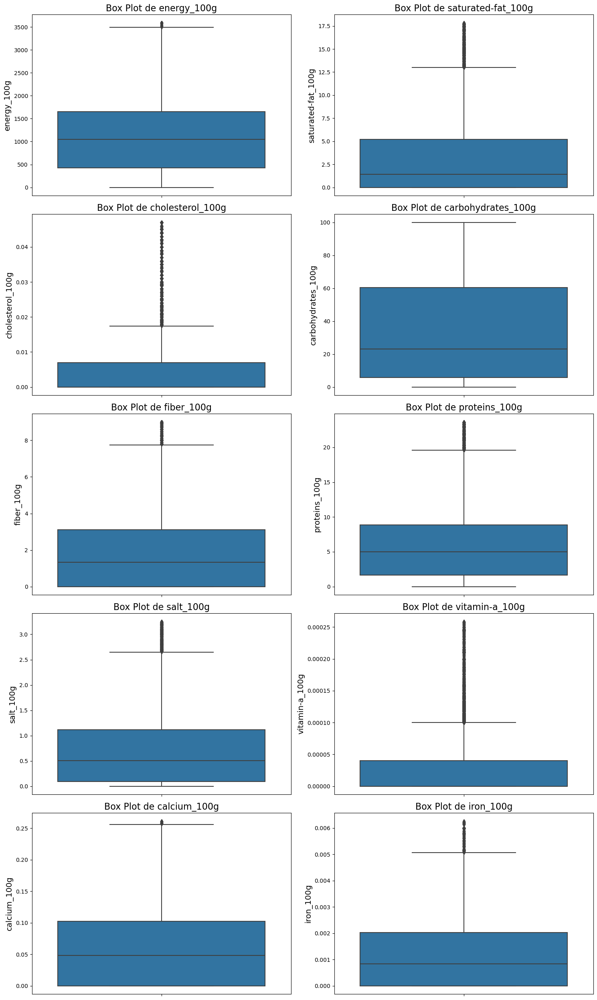

In [512]:
# Créer des boxplots pour chaque variable

# Sélectionner uniquement les colonnes numériques
numeric_columns = data_filtree3.select_dtypes(include=['number']).columns

# Nombre de colonnes numériques
num_columns = len(numeric_columns)

# Définir le nombre de lignes et de colonnes pour les subplots
num_rows = (num_columns + 1) // 2  # Organiser les box plots sur 2 colonnes

# Créer les subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 5))

# Aplatir le tableau des axes pour faciliter l'itération
axes = axes.flatten()

# Itérer sur les colonnes numériques et les axes
for i, column in enumerate(numeric_columns):
    sns.boxplot(y=data_filtree3[column], ax=axes[i])
    axes[i].set_title(f'Box Plot de {column}', fontsize=16)
    axes[i].set_ylabel(column, fontsize=14)

# Supprimer les axes vides
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### 4.3 Analyse Bivariée: Matrice de corrélation

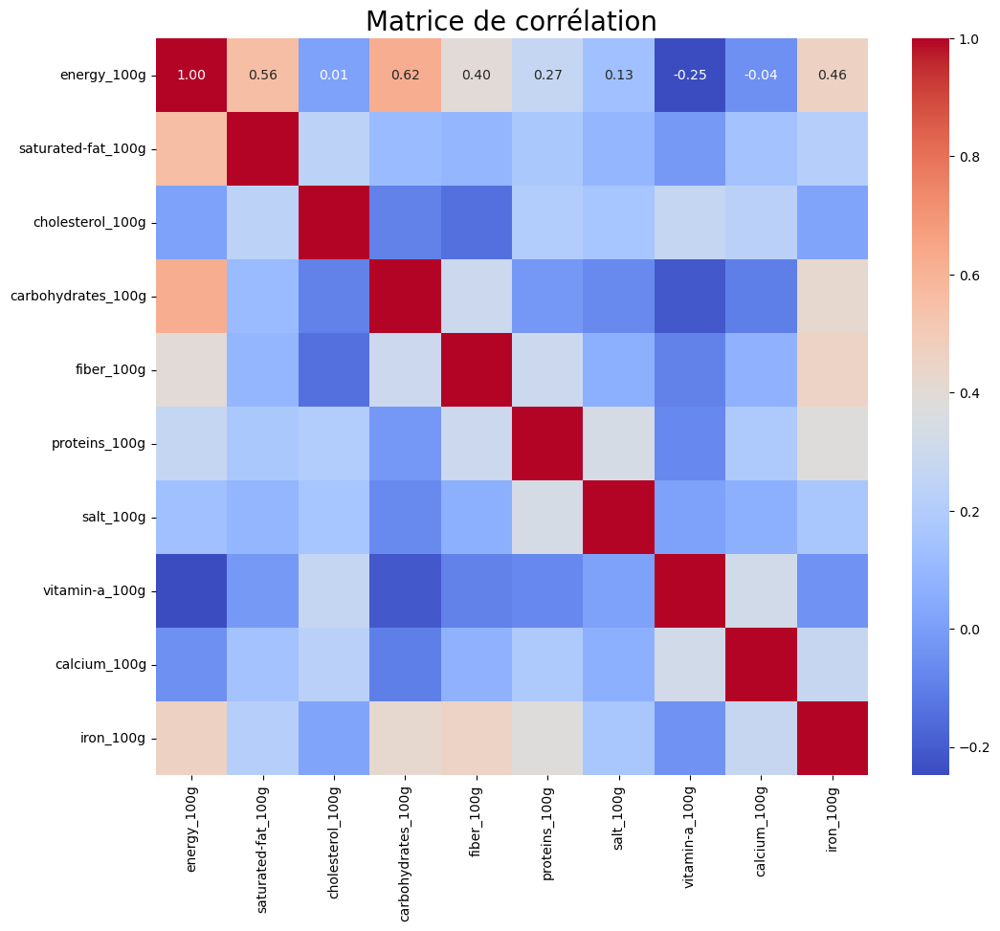

In [124]:
# Sélectionner uniquement les colonnes numériques
numeric_cols = data_filtree3.select_dtypes(include='number')

# Matrice de corrélation
corr_matrix = numeric_cols.corr()

# Afficher la heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, annot_kws={"size": 10}, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation', fontsize=20)
plt.show()

### 4.4 Visualisations bivariées : graphique de dispersion

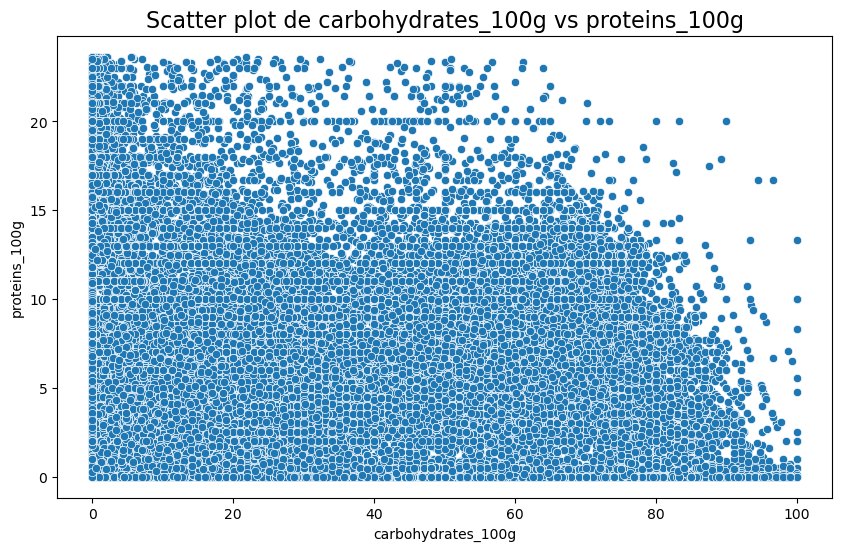

In [514]:
# Créer un Scatter plot entre les variables 'carbohydrates_100g' et 'proteins_100g'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='carbohydrates_100g', y='proteins_100g', data=data_filtree3)
plt.title('Scatter plot de carbohydrates_100g vs proteins_100g', fontsize=16)
plt.show()

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

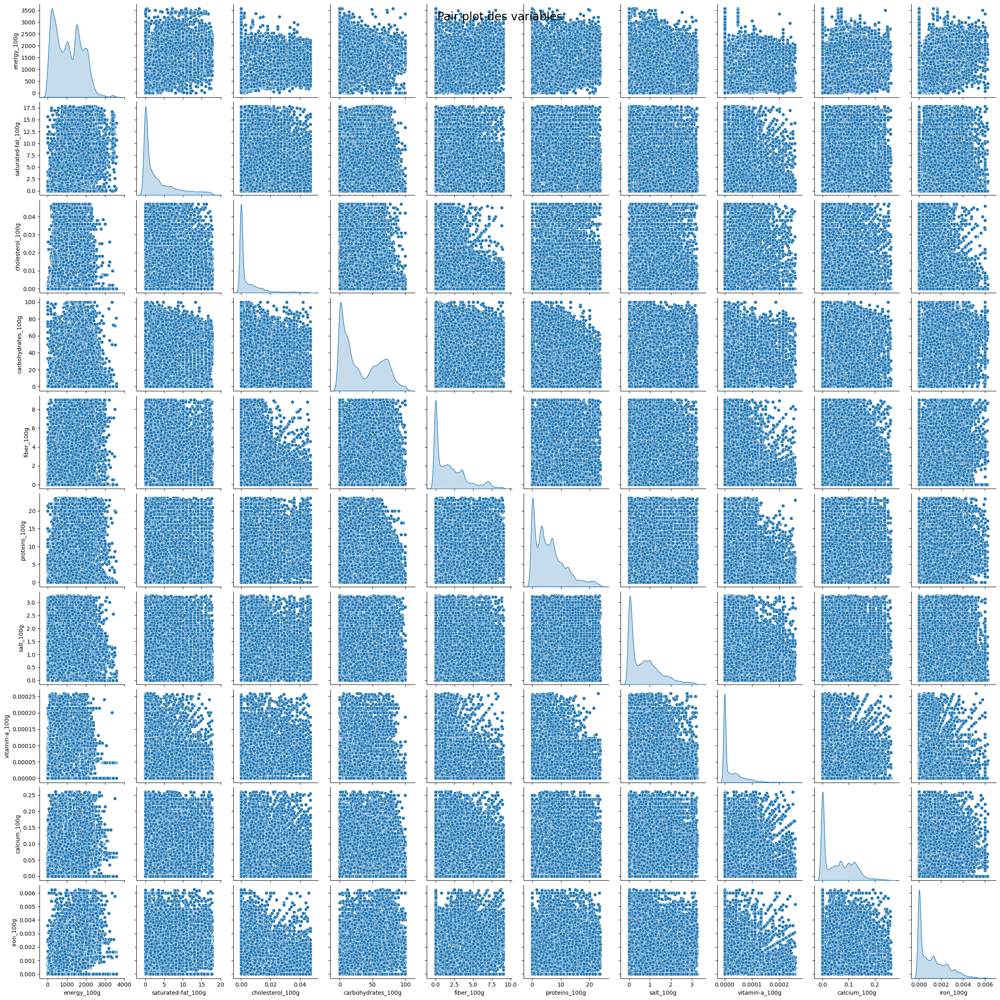

In [125]:
# Créer des Pair plot pour visualiser les relations entre les différentes variables
sns.pairplot(data_filtree3, diag_kind='kde')
plt.suptitle('Pair plot des variables', fontsize=20)
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Pair_plot_variables.png', bbox_inches='tight')
plt.show()

### 4.5 Visualisations bivariées : diagrammes de violon

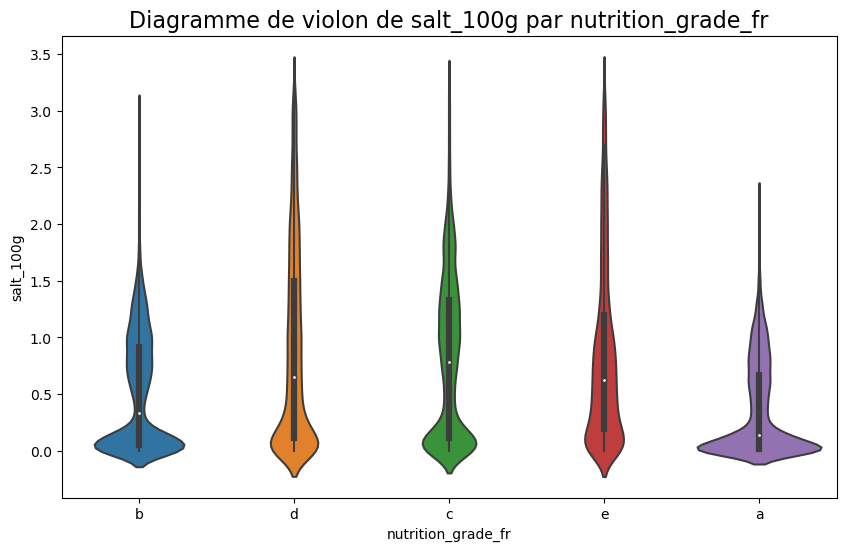

In [126]:
# Créer un diagramme de violon pour examiner la distribution de 'salt_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='salt_100g', data=data_filtree3)
plt.title('Diagramme de violon de salt_100g par nutrition_grade_fr', fontsize=16)
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Diagramme_violon_salt_100g.png', bbox_inches='tight')
plt.show()

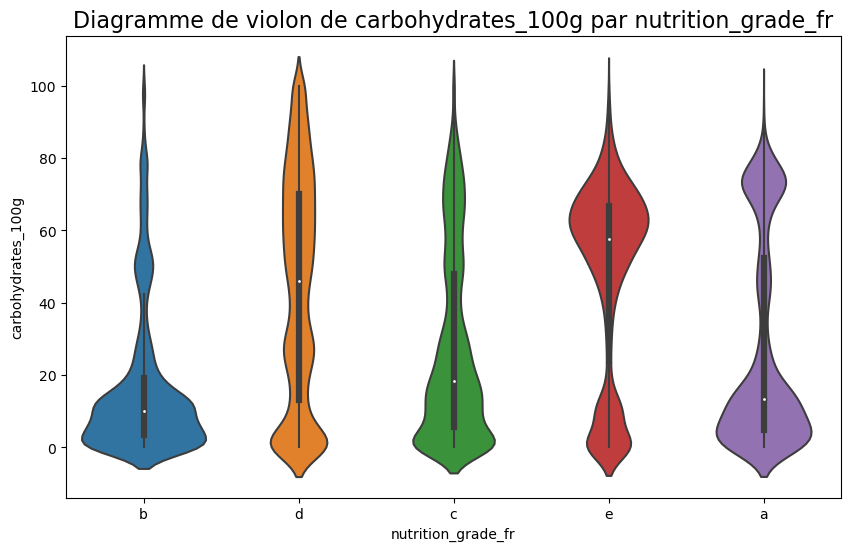

In [127]:
# Créer un diagramme de violon pour examiner la distribution de 'carbohydrates_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='carbohydrates_100g', data=data_filtree3)
plt.title('Diagramme de violon de carbohydrates_100g par nutrition_grade_fr', fontsize=16)
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Diagramme_violon_carbohydrates_100g.png', bbox_inches='tight')
plt.show()

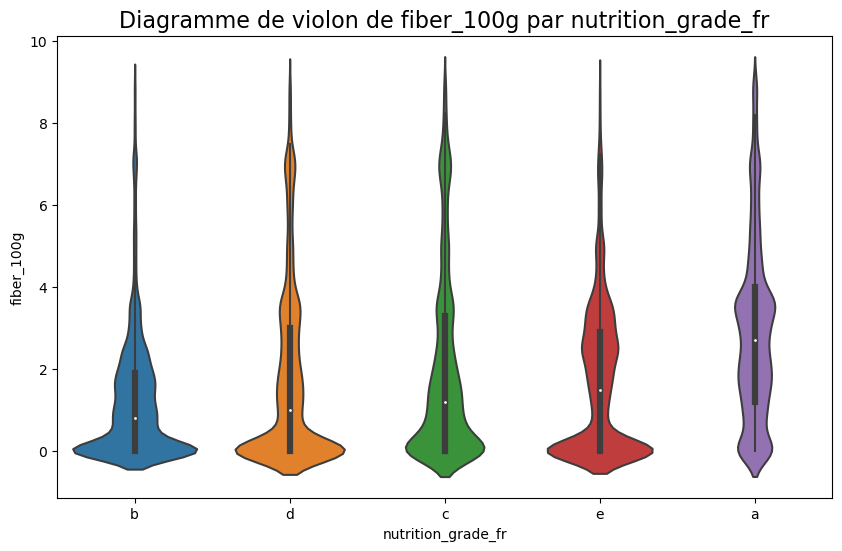

In [516]:
# Créer un diagramme de violon pour examiner la distribution de 'fiber_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='fiber_100g', data=data_filtree3)
plt.title('Diagramme de violon de fiber_100g par nutrition_grade_fr', fontsize=16)
plt.show()

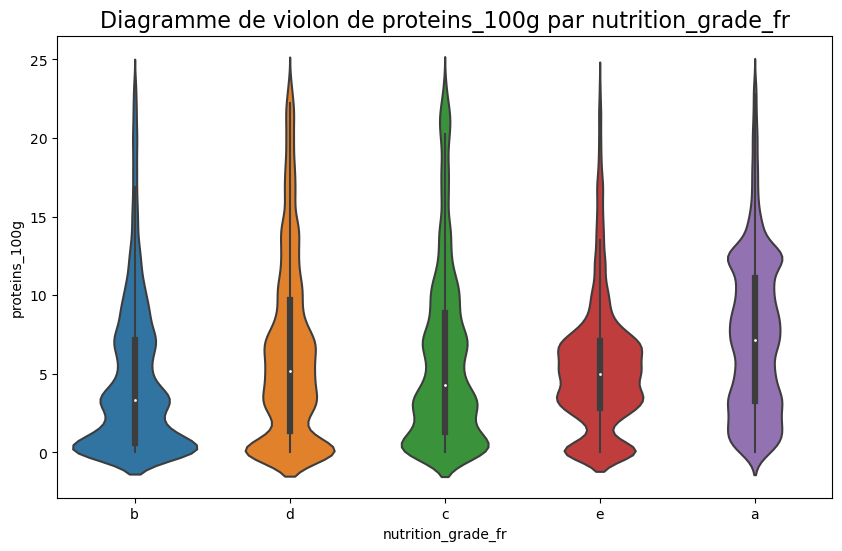

In [517]:
# Créer un diagramme de violon pour examiner la distribution de 'proteins_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='proteins_100g', data=data_filtree3)
plt.title('Diagramme de violon de proteins_100g par nutrition_grade_fr', fontsize=16)
plt.show()

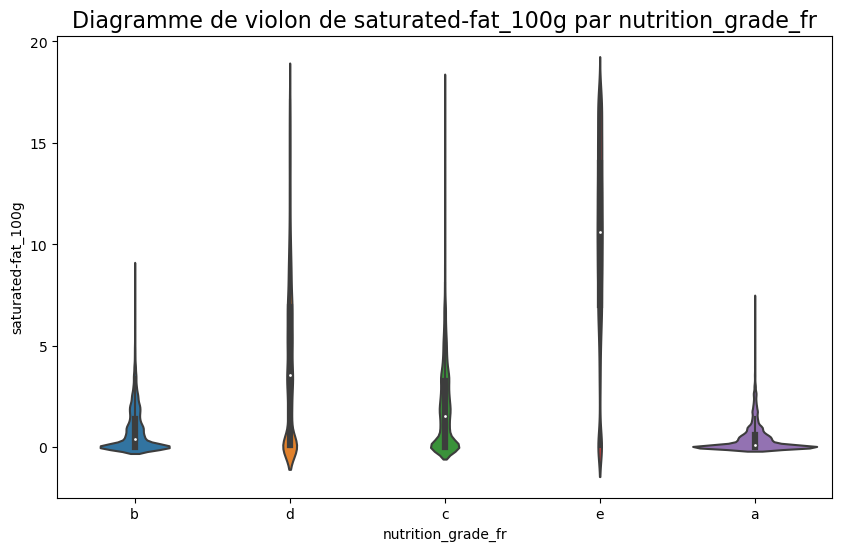

In [518]:
# Créer un diagramme de violon pour examiner la distribution de 'saturated-fat_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='saturated-fat_100g', data=data_filtree3)
plt.title('Diagramme de violon de saturated-fat_100g par nutrition_grade_fr', fontsize=16)
plt.show()

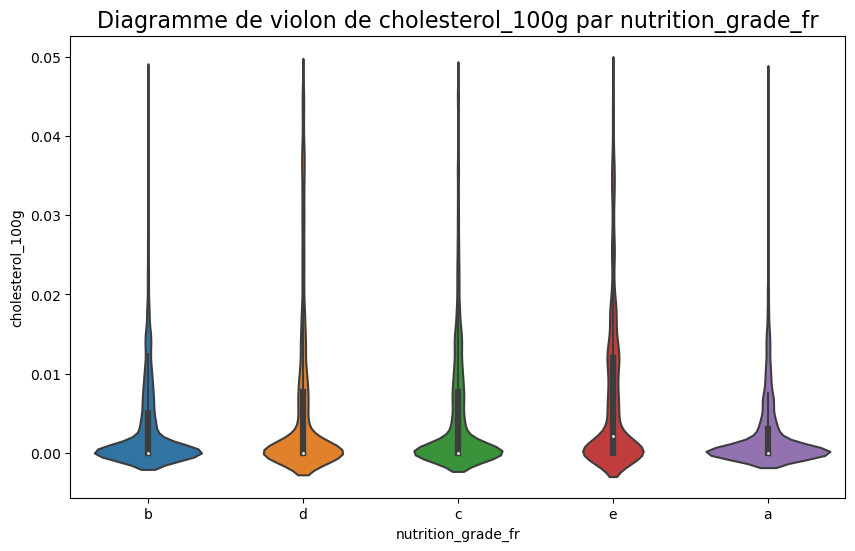

In [519]:
# Créer un diagramme de violon pour examiner la distribution de 'cholesterol_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='cholesterol_100g', data=data_filtree3)
plt.title('Diagramme de violon de cholesterol_100g par nutrition_grade_fr', fontsize=16)
plt.show()

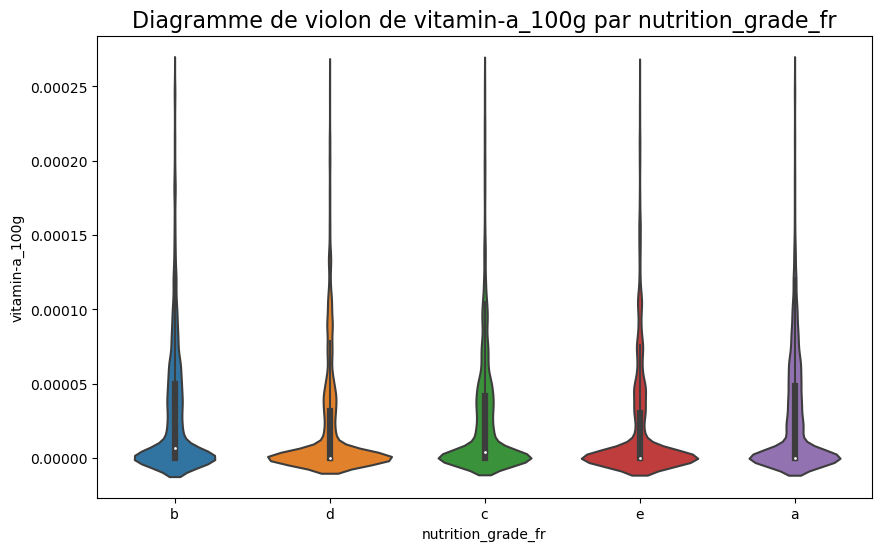

In [520]:
# Créer un diagramme de violon pour examiner la distribution de 'vitamin-a_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='vitamin-a_100g', data=data_filtree3)
plt.title('Diagramme de violon de vitamin-a_100g par nutrition_grade_fr', fontsize=16)
plt.show()

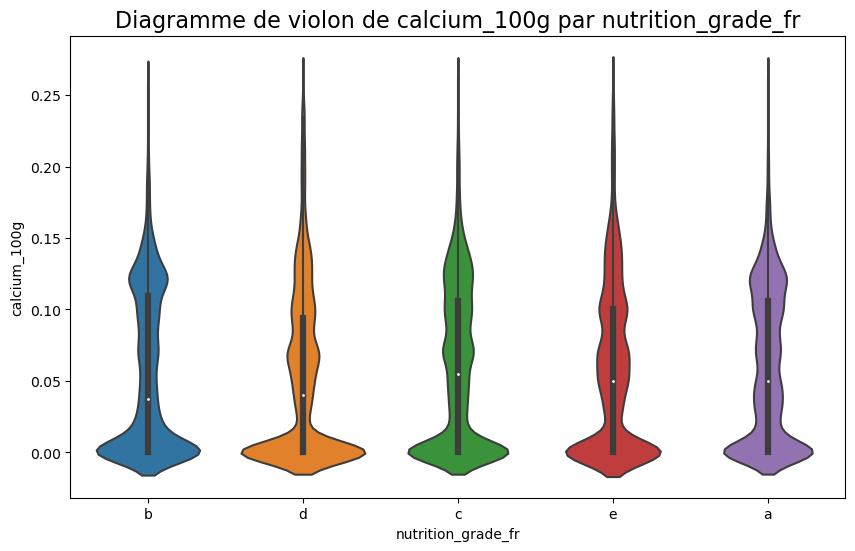

In [521]:
# Créer un diagramme de violon pour examiner la distribution de 'calcium_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='calcium_100g', data=data_filtree3)
plt.title('Diagramme de violon de calcium_100g par nutrition_grade_fr', fontsize=16)
plt.show()

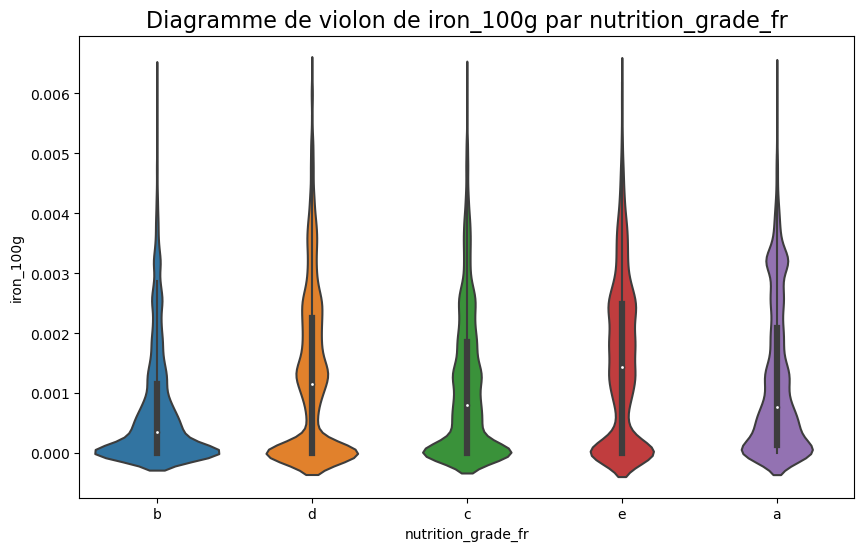

In [522]:
# Créer un diagramme de violon pour examiner la distribution de 'iron_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='iron_100g', data=data_filtree3)
plt.title('Diagramme de violon de iron_100g par nutrition_grade_fr', fontsize=16)
plt.show()

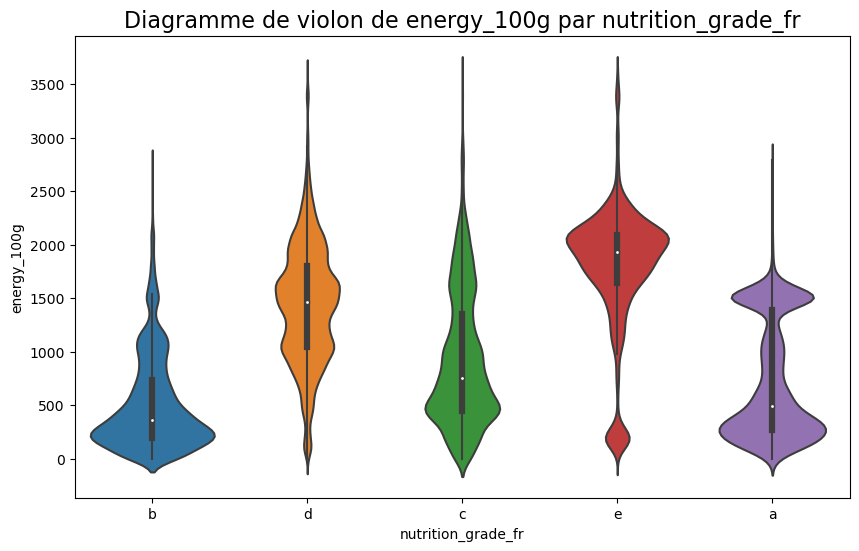

In [523]:
# Créer un diagramme de violon pour examiner la distribution de 'energy_100g' par rapport à 'nutrition_grade_fr'
plt.figure(figsize=(10, 6))
sns.violinplot(x='nutrition_grade_fr', y='energy_100g', data=data_filtree3)
plt.title('Diagramme de violon de energy_100g par nutrition_grade_fr', fontsize=16)
plt.show()

## Etape 5 : Réalisez une analyse multi-variée
- Utiliser des techniques de visualisation avancées telles que des matrices de corrélation, des graphiques en nuage de points colorés, ou des graphiques en 3D pour étudier les relations entre plusieurs variables à la fois.
- Utiliser des méthodes statistiques telles que l'analyse de variance (ANOVA), l’analyse en composante principale (ACP) ou encore l'analyse de corrélation canonique (CCA) pour quantifier les interactions entre les features.

### 5.1 visualisation avancée : matrice de corrélation

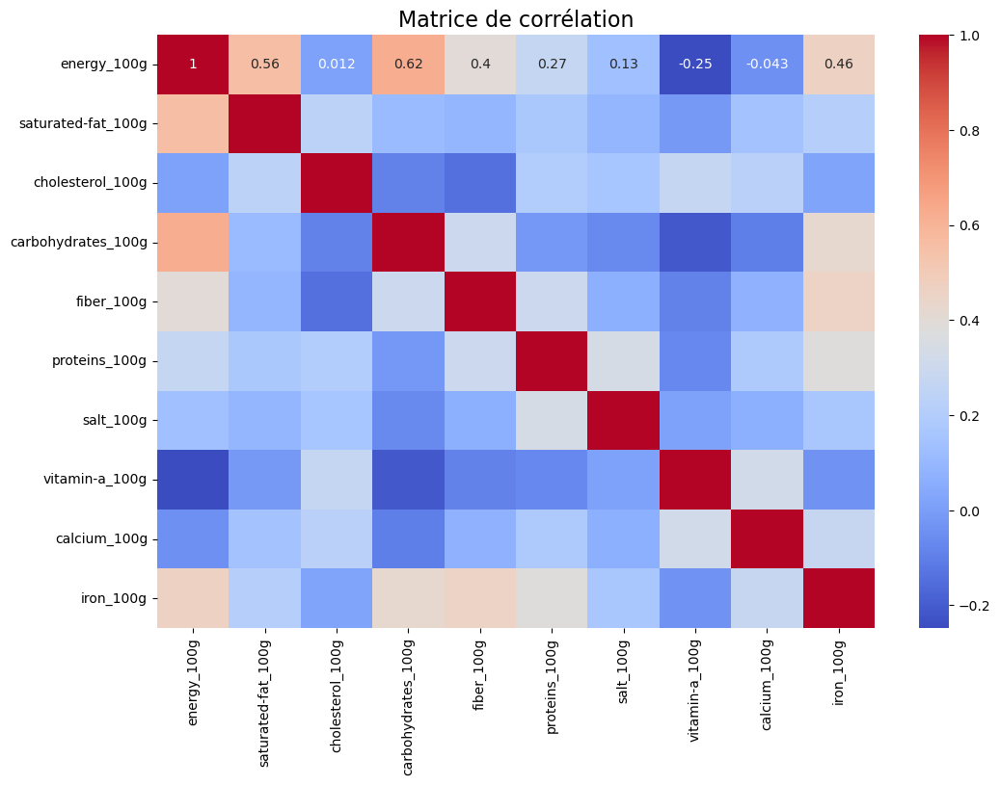

In [149]:
# Exclure les colonnes catégorielles
data_numeric = data_filtree3.select_dtypes(include=[np.number])

# Calculer la matrice de corrélation
corr_matrix = data_numeric.corr()

# Tracer la heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Matrice de corrélation', fontsize=16)
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Matrice_corrélation_analyse_bivariée.png', bbox_inches='tight')
plt.show()

 ### 5.2 visualisation avancée : Graphiques en nuage de points colorés

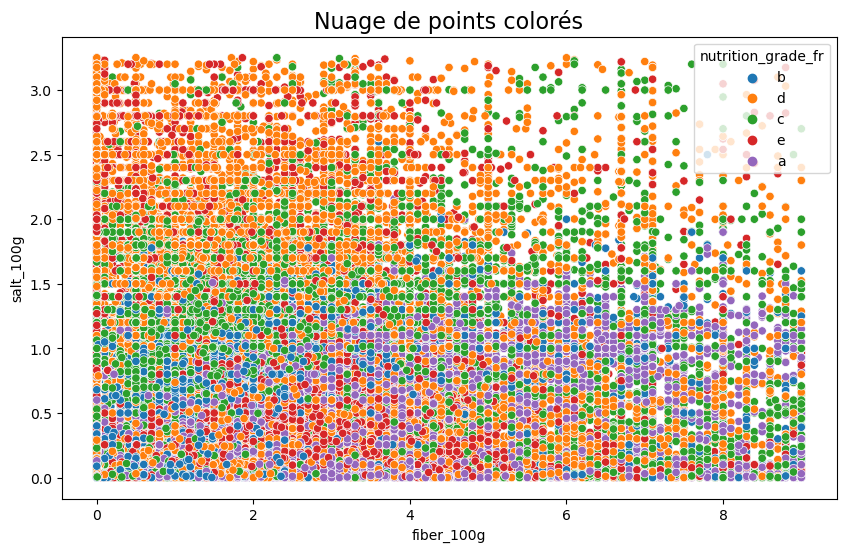

In [370]:
 # 5.2. Graphiques en nuage de points colorés
plt.figure(figsize=(10, 6))
sns.scatterplot(x='fiber_100g', y='salt_100g', hue='nutrition_grade_fr', data=data_filtree3)
plt.title('Nuage de points colorés', fontsize=16)
plt.show()

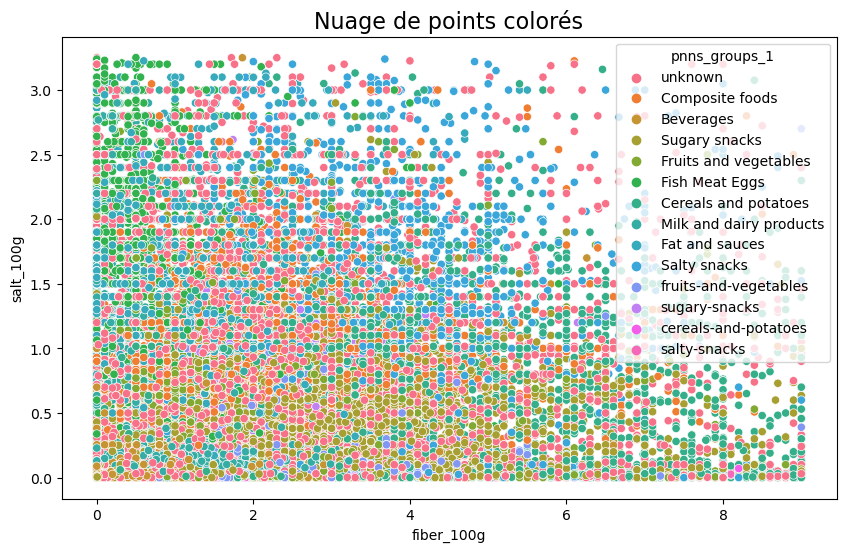

In [371]:
 # 5.2. Graphiques en nuage de points colorés
plt.figure(figsize=(10, 6))
sns.scatterplot(x='fiber_100g', y='salt_100g', hue='pnns_groups_1', data=data_filtree3)
plt.title('Nuage de points colorés', fontsize=16)
plt.show()

 ### 5.3 visualisation avancée : graphiques en 3D

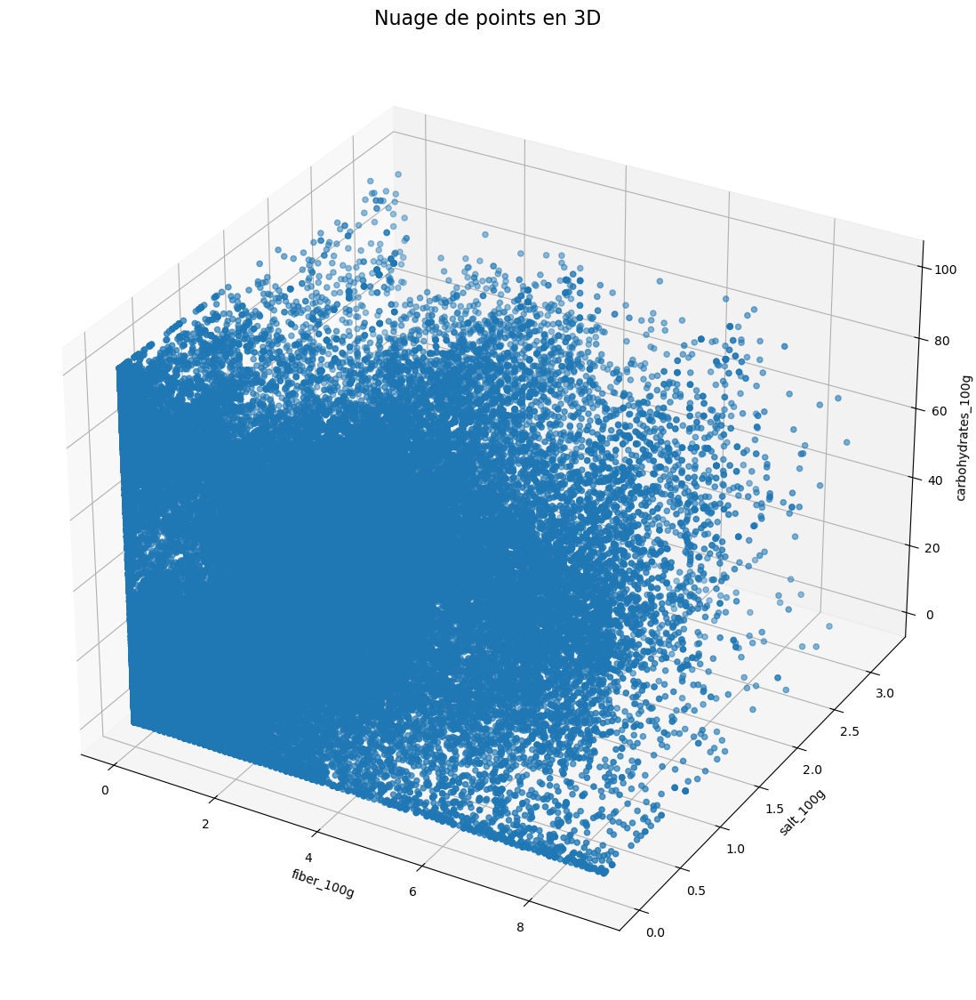

In [142]:
# 5.3. Graphique en 3D 
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_filtree3['fiber_100g'], data_filtree3['salt_100g'], data_filtree3['carbohydrates_100g'])
ax.set_xlabel('fiber_100g')
ax.set_ylabel('salt_100g')
ax.set_zlabel('carbohydrates_100g')
plt.title('Nuage de points en 3D', fontsize=16)
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Nuage_points_3D.png', bbox_inches='tight')
plt.show()

### 5.4 Analyse statistique : L’analyse en composante principale (ACP)

In [151]:
# Séparer nos données. D'un coté X la matrice des données

# Sélectionner uniquement les colonnes numériques
X = data_filtree3.select_dtypes(include=[np.number]).values

# Afficher les 5 premières lignes des valeurs numériques
print(X[:5])

[[1.94100e+03 0.00000e+00 0.00000e+00 6.07100e+01 7.10000e+00 1.78600e+01
  6.35000e-01 0.00000e+00 7.10000e-02 1.29000e-03]
 [2.54000e+03 5.36000e+00 0.00000e+00 1.78600e+01 7.10000e+00 1.78600e+01
  1.22428e+00 0.00000e+00 1.43000e-01 5.14000e-03]
 [2.23000e+03 5.00000e+00 0.00000e+00 3.66700e+01 6.70000e+00 1.66700e+01
  1.60782e+00 0.00000e+00 1.33000e-01 3.60000e-03]
 [2.09200e+03 6.67000e+00 0.00000e+00 4.66700e+01 6.70000e+00 1.33300e+01
  4.64820e-01 9.99000e-05 6.70000e-02 2.40000e-03]
 [1.95400e+03 2.22000e+00 0.00000e+00 6.00000e+01 4.40000e+00 8.89000e+00
  1.98120e-01 0.00000e+00 8.90000e-02 1.60000e-03]]


In [152]:
# Vérifier qu'on a bien un np.array 
type(X)

numpy.ndarray

In [153]:
# Vérifier la taille de notre matrice
X.shape

(101080, 10)

In [154]:
# enregistrer les noms de nos produits 'product_name' dans une variable names 
names = data_filtree3.index
names

Index([                                      'Peanuts',
                              'Organic Salted Nut Mix',
                                       'Zen Party Mix',
               'Antioxidant Mix - Berries & Chocolate',
                           'Peanut Butter Power Chews',
                 'Roasted Salted Black Pepper Cashews',
                          'Thai Curry Roasted Cashews',
                    'Organic Blueberry Almond Granola',
                        'Aunt Ginger's Snappy Granola',
         'Dark Chocolate Sea Salt & Turbinado Almonds',
       ...
            'Coffee & Chocolate With Peanuts 12 x 45G',
       'Peanut & Popcorn With Dark Chocolate 12 x 45G',
                   'Santa Cruz Chilli & Lime Dressing',
                          'Eat Natural Protein Packed',
                      'Fisherman's Friend Miel-Citron',
                 'Nature cheddar and red onion crisps',
                          'Verrine Cheescake Myrtille',
                                     

In [155]:
# Enregistrer nos colonnes, nos features, dans une variable features_numeriques

# Sélection des colonnes avec des variables numériques uniquement
features_numeriques = data_filtree3.select_dtypes(include=['number']).columns

# Affichage des colonnes numériques
features_numeriques

Index(['energy_100g', 'saturated-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'vitamin-a_100g', 'calcium_100g', 'iron_100g'],
      dtype='object')

In [380]:
#  scaler les données

In [156]:
scaler = StandardScaler()

In [157]:
scaler.fit(X)

StandardScaler()

In [158]:
X_scaled = scaler.transform(X)
X_scaled[:5]

array([[ 1.19917415, -0.7598619 , -0.55901165,  0.94610188,  2.42448531,
         2.22080219, -0.09927464, -0.618682  ,  0.24189535,  0.07387716],
       [ 2.0417    ,  0.44315375, -0.55901165, -0.51215338,  2.42448531,
         2.22080219,  0.71278361, -0.618682  ,  1.4981584 ,  3.08389454],
       [ 1.60566826,  0.36235419, -0.55901165,  0.12798154,  2.23684821,
         1.99743614,  1.24132153, -0.618682  ,  1.32367742,  1.87988759],
       [ 1.4115638 ,  0.73717437, -0.55901165,  0.46829782,  2.23684821,
         1.37050959, -0.33379146,  1.81369539,  0.17210296,  0.94170035],
       [ 1.21745935, -0.26159795, -0.55901165,  0.92193943,  1.15793489,
         0.53711021, -0.70131783, -0.618682  ,  0.55596111,  0.3162422 ]])

In [159]:
# On espère avoir une moyenne à 0 et un écart type à 1 :

idx = ["mean", "std"]

pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6,7,8,9
mean,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [160]:
# Nous allons travailler sur nos 10 composantes 
n_components = 10

In [161]:
# On instancie notre ACP 
pca = PCA(n_components=n_components)

In [162]:
# On l'entraine sur les données scalées :
pca.fit(X_scaled)

PCA(n_components=10)

#### Variance expliquée et tracé d'éboulis

In [163]:
# Intéressons nous maintenant à la variance captée par chaque nouvelle composante. Grace à scikit-learn on peut utiliser l'attribut explained_variance_ratio_ :
pca.explained_variance_ratio_

array([0.2774969 , 0.18454785, 0.11608135, 0.11401468, 0.07576105,
       0.06658849, 0.06382607, 0.04647016, 0.03816415, 0.01704931])

##### Ici la 1ère composante capte 27% de la variance de nos données initiales, la 2ème 18% etc etc, donc on a besoin de 4 composantes pour arriver à environ 70%

In [164]:
# Enregistrer cela dans une variable :
scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([27.75, 18.45, 11.61, 11.4 ,  7.58,  6.66,  6.38,  4.65,  3.82,
        1.7 ])

In [165]:
# Calculer la somme cumulée de nos composantes
scree_cum = scree.cumsum().round()
scree_cum

array([ 28.,  46.,  58.,  69.,  77.,  83.,  90.,  94.,  98., 100.])

In [166]:
# Définir ensuite une variable avec la liste de nos composantes :
x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

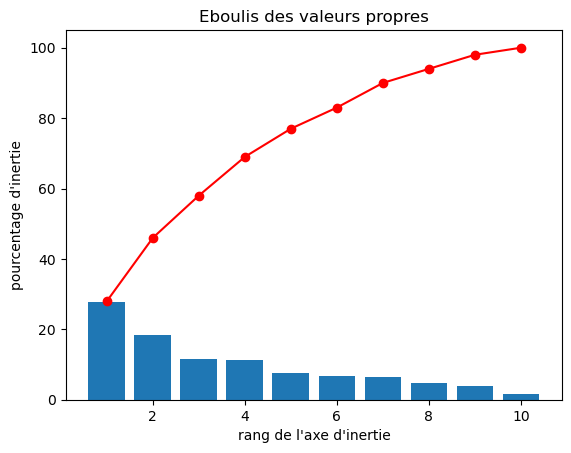

In [167]:
# Afficher de façon graphique la variable représentant la liste de nos composantes
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
# Sauvegarde de la figure en tant qu'image 
plt.savefig('Eboulis_valeurs_propres.png', bbox_inches='tight')
plt.show(block=False)

##### On a en bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.
##### On voit ici que près de 70% de la variance est comprise dans les 4 premières composantes, et près de 90% dans les 7 premières.

In [168]:
# Calculer nos composantes
pcs = pca.components_
pcs

array([[ 0.50894595,  0.31405874,  0.04639148,  0.36741897,  0.37500077,
         0.317142  ,  0.16368126, -0.13239963,  0.10158637,  0.45754412],
       [-0.15006259,  0.16472941,  0.48886037, -0.33100123, -0.09597748,
         0.28882901,  0.279187  ,  0.44705036,  0.47551594,  0.07246015],
       [ 0.27039417,  0.5328909 ,  0.33050463,  0.23600684, -0.32014459,
        -0.41877782, -0.38705567,  0.16189582,  0.01358282, -0.15462044],
       [-0.13864644, -0.27000247, -0.20869896,  0.19222786,  0.31126885,
        -0.2297291 , -0.47119654,  0.40677044,  0.44949018,  0.29694357],
       [ 0.02671689, -0.42965545,  0.29363878,  0.50843551, -0.12734226,
        -0.23684545,  0.44504134,  0.34251403, -0.27040699,  0.09561691],
       [-0.12132607, -0.33596232,  0.58749305,  0.13847377, -0.04445323,
         0.37752709, -0.49913829, -0.3180315 , -0.08722315,  0.0754486 ],
       [ 0.06020648,  0.09950687,  0.13833687, -0.19573601,  0.58258166,
         0.11773769, -0.16522591,  0.44929173

In [169]:
# Afficher la même chose mais version pandas
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7,8,9
0,0.508946,0.314059,0.046391,0.367419,0.375001,0.317142,0.163681,-0.132400,0.101586,0.457544
1,-0.150063,0.164729,0.488860,-0.331001,-0.095977,0.288829,0.279187,0.447050,0.475516,0.072460
2,0.270394,0.532891,0.330505,0.236007,-0.320145,-0.418778,-0.387056,0.161896,0.013583,-0.154620
3,-0.138646,-0.270002,-0.208699,0.192228,0.311269,-0.229729,-0.471197,0.406770,0.449490,0.296944
4,0.026717,-0.429655,0.293639,0.508436,-0.127342,-0.236845,0.445041,0.342514,-0.270407,0.095617
5,-0.121326,-0.335962,0.587493,0.138474,-0.044453,0.377527,-0.499138,-0.318032,-0.087223,0.075449
6,0.060206,0.099507,0.138337,-0.195736,0.582582,0.117738,-0.165226,0.449292,-0.536221,-0.243033
7,0.075953,0.031858,-0.361449,0.042156,-0.531420,0.482424,-0.210551,0.401244,-0.278241,0.250813
8,-0.266644,0.168926,0.141051,-0.334952,-0.011014,-0.340437,-0.002687,-0.095492,-0.335889,0.728224
9,0.728143,-0.424771,0.070886,-0.482521,-0.103244,-0.163506,-0.067716,0.022477,0.053285,0.078756


In [171]:
# Afficher nos composantes d'une façon plus claire
pcs.columns = features_numeriques
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,energy_100g,saturated-fat_100g,cholesterol_100g,carbohydrates_100g,fiber_100g,proteins_100g,salt_100g,vitamin-a_100g,calcium_100g,iron_100g
F1,0.51,0.31,0.05,0.37,0.38,0.32,0.16,-0.13,0.10,0.46
F2,-0.15,0.16,0.49,-0.33,-0.10,0.29,0.28,0.45,0.48,0.07
F3,0.27,0.53,0.33,0.24,-0.32,-0.42,-0.39,0.16,0.01,-0.15
F4,-0.14,-0.27,-0.21,0.19,0.31,-0.23,-0.47,0.41,0.45,0.30
F5,0.03,-0.43,0.29,0.51,-0.13,-0.24,0.45,0.34,-0.27,0.10
F6,-0.12,-0.34,0.59,0.14,-0.04,0.38,-0.50,-0.32,-0.09,0.08
F7,0.06,0.10,0.14,-0.20,0.58,0.12,-0.17,0.45,-0.54,-0.24
F8,0.08,0.03,-0.36,0.04,-0.53,0.48,-0.21,0.40,-0.28,0.25
F9,-0.27,0.17,0.14,-0.33,-0.01,-0.34,-0.00,-0.10,-0.34,0.73
F10,0.73,-0.42,0.07,-0.48,-0.10,-0.16,-0.07,0.02,0.05,0.08


In [175]:
# inverser l'affichage de nos composantes
pcs.T

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10
energy_100g,0.508946,-0.150063,0.270394,-0.138646,0.026717,-0.121326,0.060206,0.075953,-0.266644,0.728143
saturated-fat_100g,0.314059,0.164729,0.532891,-0.270002,-0.429655,-0.335962,0.099507,0.031858,0.168926,-0.424771
cholesterol_100g,0.046391,0.488860,0.330505,-0.208699,0.293639,0.587493,0.138337,-0.361449,0.141051,0.070886
carbohydrates_100g,0.367419,-0.331001,0.236007,0.192228,0.508436,0.138474,-0.195736,0.042156,-0.334952,-0.482521
fiber_100g,0.375001,-0.095977,-0.320145,0.311269,-0.127342,-0.044453,0.582582,-0.531420,-0.011014,-0.103244
proteins_100g,0.317142,0.288829,-0.418778,-0.229729,-0.236845,0.377527,0.117738,0.482424,-0.340437,-0.163506
salt_100g,0.163681,0.279187,-0.387056,-0.471197,0.445041,-0.499138,-0.165226,-0.210551,-0.002687,-0.067716
vitamin-a_100g,-0.132400,0.447050,0.161896,0.406770,0.342514,-0.318032,0.449292,0.401244,-0.095492,0.022477
calcium_100g,0.101586,0.475516,0.013583,0.449490,-0.270407,-0.087223,-0.536221,-0.278241,-0.335889,0.053285
iron_100g,0.457544,0.072460,-0.154620,0.296944,0.095617,0.075449,-0.243033,0.250813,0.728224,0.078756


<Axes: >

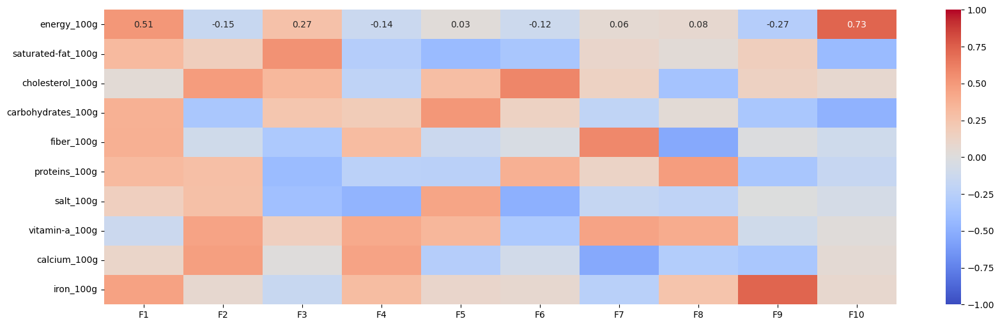

In [176]:
# Afficher nos composantes avec une représentation plus visuelle
# Carte de chaleur des variables en fonction des composantes
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

In [177]:
# Définir nos axes x et y.
x, y = 0,1

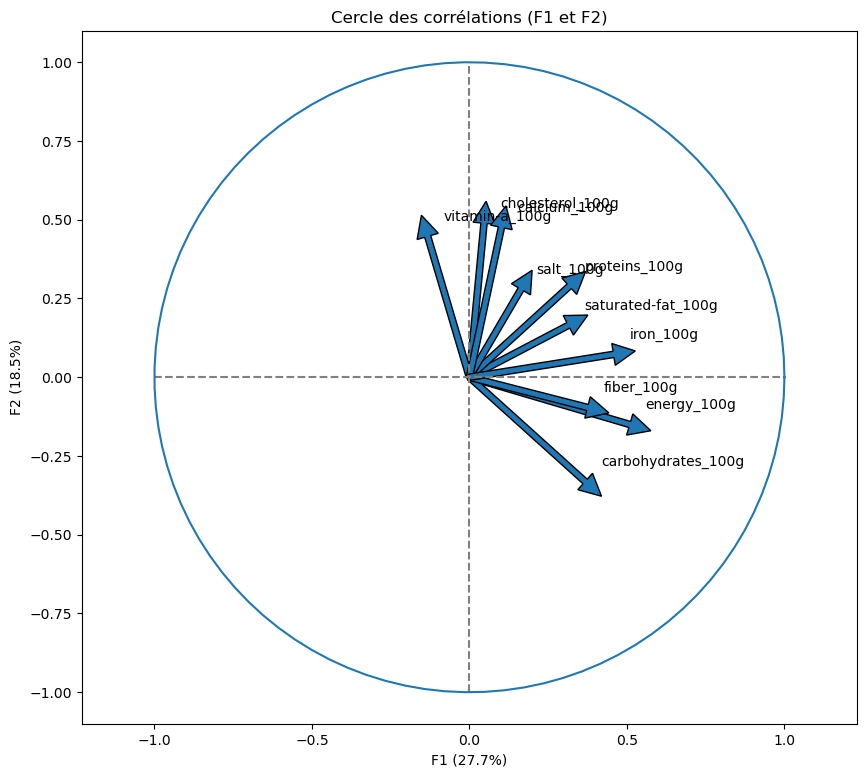

In [180]:
# Créer un cercle de corrélation F1/F2

# Sélection des colonnes pour l'ACP
features = ['energy_100g', 'saturated-fat_100g', 'cholesterol_100g', 'carbohydrates_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'vitamin-a_100g', 'calcium_100g', 'iron_100g']

# Standardisation des données
x = data_filtree3[features].values
x = StandardScaler().fit_transform(x)

# Réaliser l'ACP
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Générer le cercle de corrélation
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(pca.components_.shape[1]):
    ax.arrow(0, 0,  # Start the arrow at the origin
             pca.components_[0, i],  # 0 for PC1
             pca.components_[1, i],  # 1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02)

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             features[i])

# Affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')

# Nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F1 ({}%)'.format(round(100*pca.explained_variance_ratio_[0], 1)))
plt.ylabel('F2 ({}%)'.format(round(100*pca.explained_variance_ratio_[1], 1)))

plt.title("Cercle des corrélations (F1 et F2)")

an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Ajouter un cercle unité pour l'échelle
plt.axis('equal')

# Sauvegarde de la figure en tant qu'image 
plt.savefig('Cercle_corrélationF1_F2.png', bbox_inches='tight')
plt.show()

  Dans ce cercle de corrélation (F1/F2) on voit que :
- les variables energy_100g et iron_100g sont les plus corrélées positivement à F1
- les variables vitamin-a_100g, cholesterol_100g et calcium_100g sont les plus corrélées positivement à F2
- les variables energy_100g et fiber_100g sont très corrélées entre eux
- les variables energy_100g et cholesterol_100g sont indépendantes

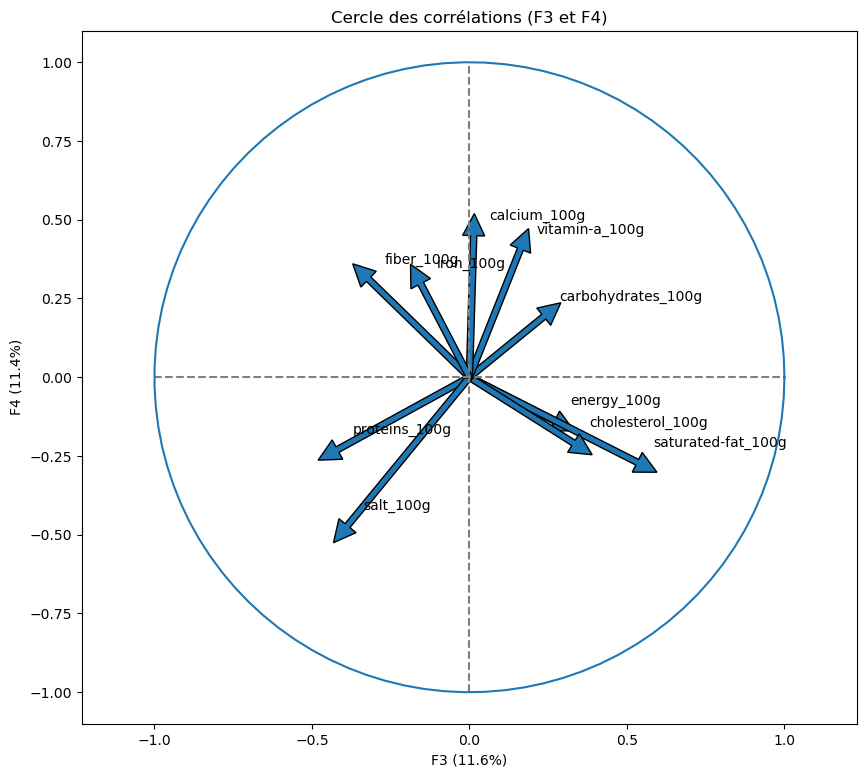

In [182]:
# Créer un cercle de corrélation F3/F4

# Sélection des colonnes pour l'ACP
features = ['energy_100g', 'saturated-fat_100g', 'cholesterol_100g', 'carbohydrates_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'vitamin-a_100g', 'calcium_100g', 'iron_100g']

# Standardisation des données
x = data_filtree3[features].values
x = StandardScaler().fit_transform(x)

# Réaliser l'ACP avec un nombre de composantes suffisant pour obtenir F3 et F4
pca = PCA(n_components=4)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4'])

# Fonction pour générer le cercle de corrélation pour des composantes principales spécifiques
def correlation_graph(pca, components, features):
    fig, ax = plt.subplots(figsize=(10, 9))
    for i in range(pca.components_.shape[1]):
        ax.arrow(0, 0,  # Start the arrow at the origin
                 pca.components_[components[0], i],  # Component X
                 pca.components_[components[1], i],  # Component Y
                 head_width=0.07,
                 head_length=0.07, 
                 width=0.02)

        plt.text(pca.components_[components[0], i] + 0.05,
                 pca.components_[components[1], i] + 0.05,
                 features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(components[0] + 1, round(100 * pca.explained_variance_ratio_[components[0]], 1)))
    plt.ylabel('F{} ({}%)'.format(components[1] + 1, round(100 * pca.explained_variance_ratio_[components[1]], 1)))

    plt.title("Cercle des corrélations (F{} et F{})".format(components[0] + 1, components[1] + 1))

    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Ajouter un cercle unité pour l'échelle
    plt.axis('equal')
    # Sauvegarde de la figure en tant qu'image 
    plt.savefig('Cercle_corrélationF3_F4.png', bbox_inches='tight')
    plt.show()

# Créer le graphique de corrélation pour F3 et F4
correlation_graph(pca, (2, 3), features)

 Dans ce cercle de corrélation (F3/F4) on voit que :
- la variables saturated-fat_100g est la plus corrélée positivement à F3
- la variable salt_100g est la plus corrélée négativement à F4
- la variable calcium_100g est à 0.5 sur F4 et à 0 sur F3, cette variable est bien corrélée avec F4 et elle n'a pas d'impact sur l'axe des abscisses F3
- les variables vitamin-a_100g, energy_100g sont indépendantes

In [183]:
# Automatisation du processus avec une fonction

def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

In [184]:
# Préciser 0 et 1  pour F1 et F2 
x_y = (0,1)
x_y

(0, 1)

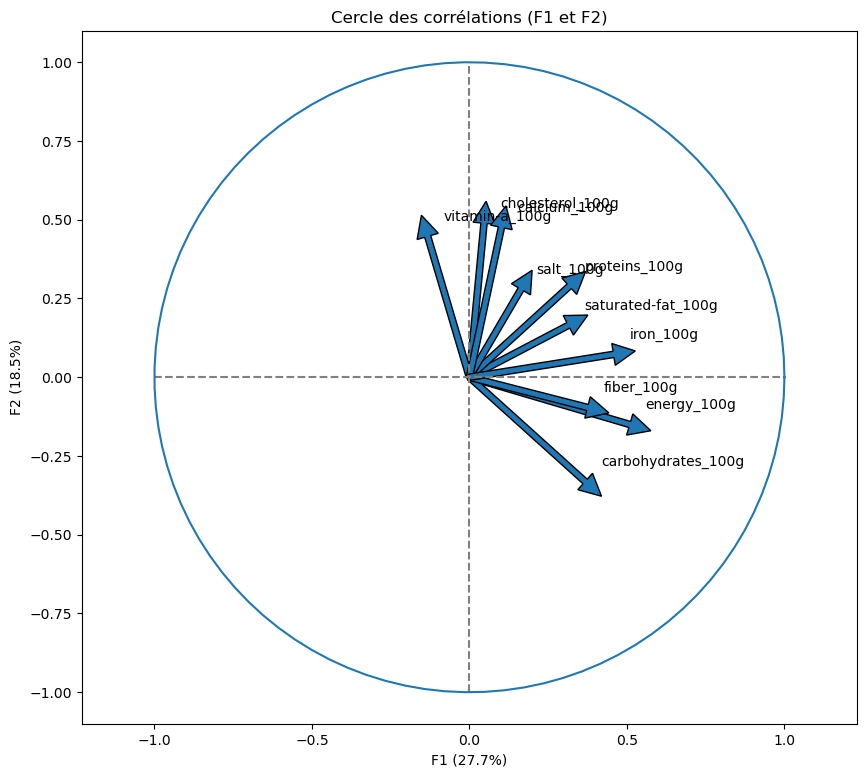

In [185]:
correlation_graph(pca, x_y, features)

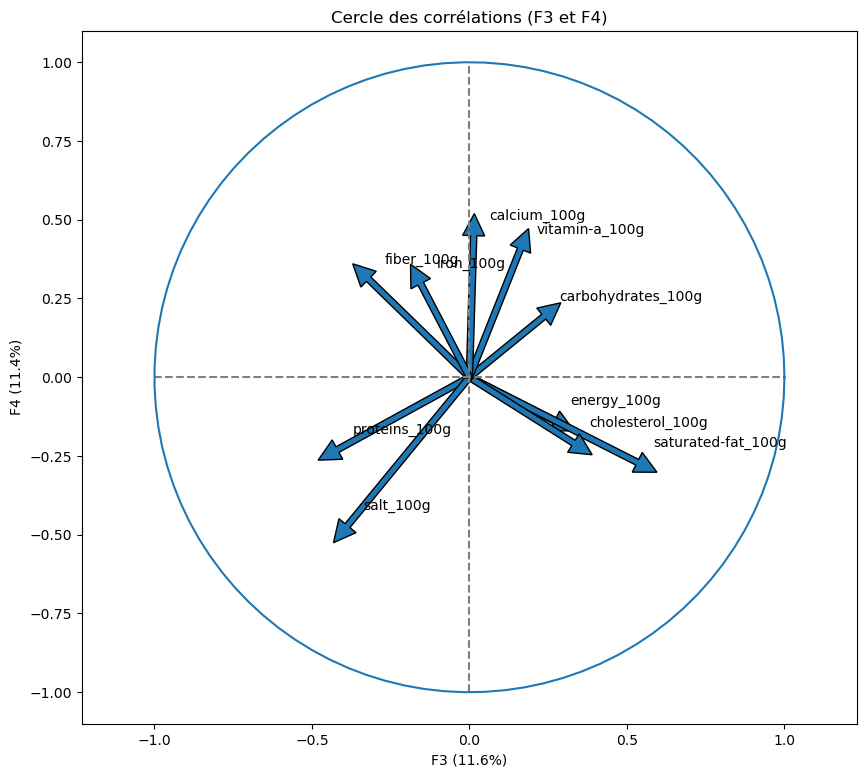

In [186]:
# Créer le graphique de corrélation pour F3 et F4
correlation_graph(pca, (2,3), features)

In [187]:
# Faire la projection de nos dimensions
# calculer les coordonnées de nos individus dans le nouvel espace

X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[ 2.43088867, -0.66674616, -1.81822628,  0.50770277],
       [ 4.33946939,  0.92987411, -2.05615271,  0.86159922],
       [ 3.70407246,  0.70095489, -1.93320198,  0.37483458],
       [ 2.52310458,  0.53017783, -0.31021909,  1.44538257],
       [ 1.62312874, -0.94532987, -0.2430766 ,  0.85536462]])

In [188]:
# rappeler que 
x_y

(0, 1)

In [189]:
# représentation des individus dans le plan factoriel avec en couleur le nutriscore.

# Automatisation du processus avec une fonction

def display_factorial_planes(X_projected, 
                             x_y, 
                             pca=None, 
                             labels=None,
                             clusters=None, 
                             alpha=1,
                             figsize=[10,8], 
                             marker="."):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if labels is None: 
        labels = []
    try: 
        len(labels)
    except Exception as e: 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) == 2: 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y) >= X_.shape[1]: 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters

    # Les points    
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, alpha=alpha, marker=marker)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca: 
        v1 = str(round(100 * pca.explained_variance_ratio_[x])) + " %"
        v2 = str(round(100 * pca.explained_variance_ratio_[y])) + " %"
    else: 
        v1 = v2 = ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() * 1.1
    y_max = np.abs(X_[:, y]).max() * 1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom=-y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0, 0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels): 
        for i, (_x, _y) in enumerate(X_[:, [x, y]]):
            plt.text(_x, _y + 0.05, labels[i], fontsize='14', ha='center', va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()

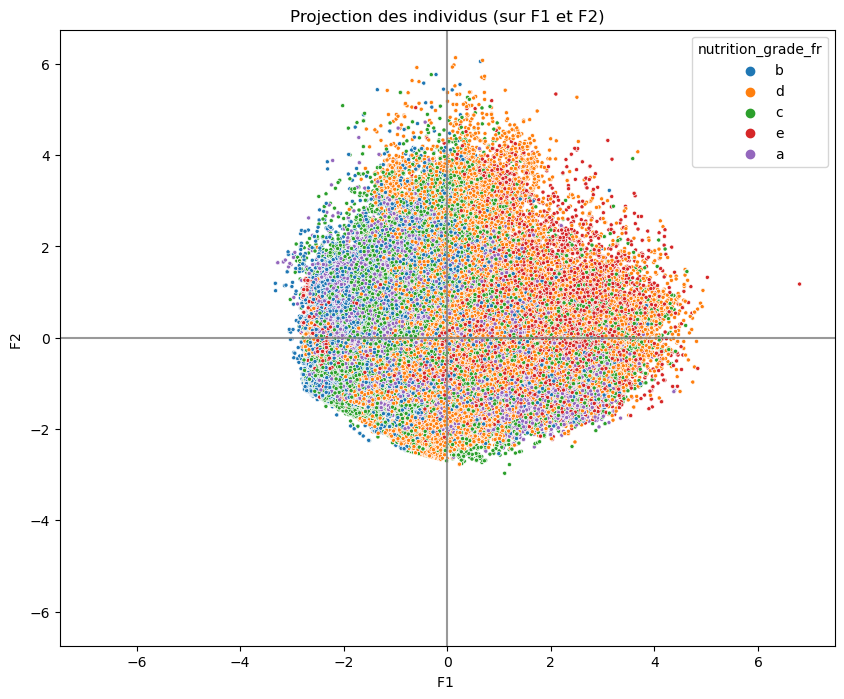

<Figure size 640x480 with 0 Axes>

In [194]:
# Afficher la projection des individus
x_y = [0,1]
display_factorial_planes(X_proj, x_y, clusters=data_filtree3['nutrition_grade_fr'])
# Sauvegarder le graphique
plt.savefig('projection_individus_F1_F2.png')

# Afficher le graphique pour vérifier qu'il est correctement dessiné
plt.show()

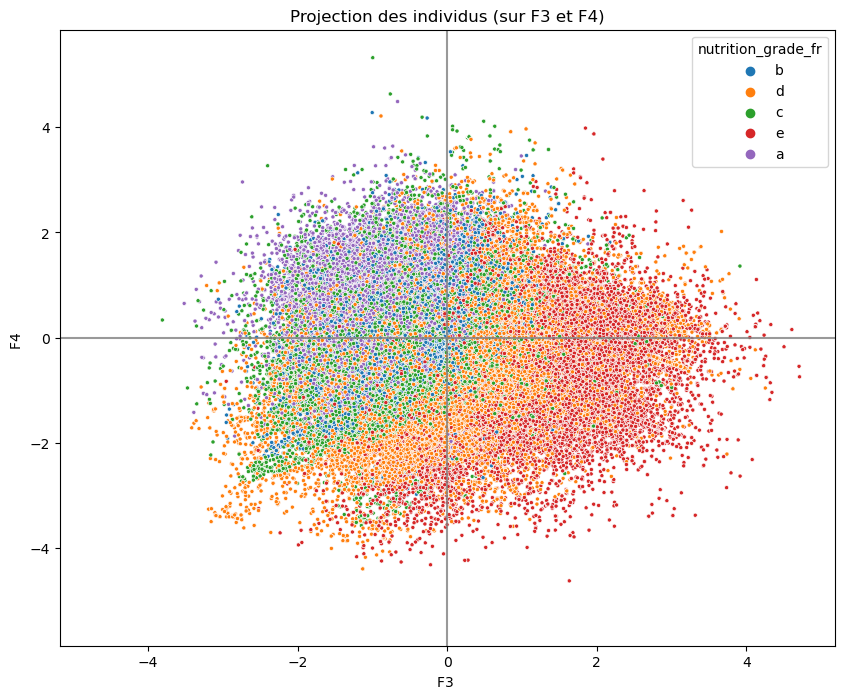

<Figure size 640x480 with 0 Axes>

In [193]:
# Afficher la projection des individus
x_y = [2,3]
display_factorial_planes(X_proj, x_y, clusters=data_filtree3['nutrition_grade_fr'])
# Sauvegarder le graphique
plt.savefig('projection_individus_F3_F4.png')